1.https://github.com/valerielimyh/Predict_housing_prices/blob/master/notebooks/04-Model_building.ipynb

In [1]:
import pickle 
import re
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn import datasets
import seaborn as sns  

from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV, ElasticNet, lars_path
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn import preprocessing
from math import sqrt
import patsy
import scipy.stats as stats

import statsmodels.api as sm
import statsmodels.formula.api as smf

#Settings
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
pd.options.display.max_columns = None
pd.options.display.float_format = '{:.2f}'.format
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.max_rows', 500)
from IPython.core.interactiveshell import InteractiveShell  
InteractiveShell.ast_node_interactivity = "all"
seed =123

<ipython-input-1-d3a60cbd3b9c>:28: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


# Cleaning dataset
https://github.com/valerielimyh/Predict_housing_prices/blob/master/notebooks/02-cleaning.ipynb

In [3]:
df = pd.read_csv('2019_hdb_dataset_with_mrt_schools_sm.csv')
df = df.drop(columns = ['Unnamed: 0'])
df.sample(3)

,town,flat_type,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,Year,address,Latitude,Longtitude,Postal,full_address,nearest_mrt,nearest_mrt_distance(km),nearest_primary_school,nearest_primary_school(km),nearest_secondary_school,nearest_secondary_school(km),nearest_JC/MI,nearest_JC/MI(km),nearest_mixed_level,nearest_mixed_level(km),nearest_sm,nearest_sm_distance(km)
5810,SENGKANG,4 ROOM,07 TO 09,94.00,Premium Apartment,2013,93 years 02 months,435000.00,2019,435A FERNVALE RD,1.39,103.88,791435,435A FERNVALE ROAD FERNVALE RESIDENCE SINGAPORE 791435,FERNVALE LRT STATION,0.17,SENGKANG GREEN PRIMARY SCHOOL,0.14,PEI HWA SECONDARY SCHOOL,0.42,ANDERSON SERANGOON JUNIOR COLLEGE,3.77,CHIJ ST. NICHOLAS GIRLS' SCHOOL,5.15,NTUC Fairprice Co-operative Ltd,0.22
21954,WOODLANDS,5 ROOM,04 TO 06,121.00,Improved,1997,76 years 11 months,402000.00,2019,793 WOODLANDS AVE 6,1.44,103.80,730793,793 WOODLANDS AVENUE 6 HDB-WOODLANDS SINGAPORE 730793,ADMIRALTY MRT STATION,0.29,ADMIRALTY PRIMARY SCHOOL,0.31,ADMIRALTY SECONDARY SCHOOL,0.39,YISHUN INNOVA JUNIOR COLLEGE,3.57,SINGAPORE SPORTS SCHOOL,2.31,COLD STORAGE SINGAPORE (1983) PTE LTD,0.29
6961,CHOA CHU KANG,4 ROOM,04 TO 06,100.00,Model A,1997,77 years,358000.00,2019,626 CHOA CHU KANG ST 62,1.40,103.75,680626,626 CHOA CHU KANG STREET 62 HDB-CHOA CHU KANG SINGAPORE 680626,YEW TEE MRT STATION,0.19,DE LA SALLE SCHOOL,0.45,UNITY SECONDARY SCHOOL,0.15,JURONG PIONEER JUNIOR COLLEGE,1.76,SINGAPORE SPORTS SCHOOL,5.76,NTUC Fairprice Co-operative Ltd,0.14


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22186 entries, 0 to 22185
Data columns (total 26 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   town                          22186 non-null  object 
 1   flat_type                     22186 non-null  object 
 2   storey_range                  22186 non-null  object 
 3   floor_area_sqm                22186 non-null  float64
 4   flat_model                    22186 non-null  object 
 5   lease_commence_date           22186 non-null  int64  
 6   remaining_lease               22186 non-null  object 
 7   resale_price                  22186 non-null  float64
 8   Year                          22186 non-null  int64  
 9   address                       22186 non-null  object 
 10  Latitude                      22186 non-null  float64
 11  Longtitude                    22186 non-null  float64
 12  Postal                        22186 non-null  object 
 13  f

In [6]:
# df['month']=pd.to_datetime(df['month'])
# df['month'].head()
# df['Year'] = df['month'].apply(lambda x: x.year)
# df['Month'] = df['month'].apply(lambda y: y.month)
df['house_age'] = df['Year'] - df['lease_commence_date']
# df = df.drop(columns = ['month','Month','Year'])
df['remaining_lease'] = df['remaining_lease'].str.split(' ')
df['remaining_lease'] = df['remaining_lease'].apply(lambda x: x[0])
df['remaining_lease'] = df['remaining_lease'].astype(int)

In [7]:
df.sample(3)

,town,flat_type,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,Year,address,Latitude,Longtitude,Postal,full_address,nearest_mrt,nearest_mrt_distance(km),nearest_primary_school,nearest_primary_school(km),nearest_secondary_school,nearest_secondary_school(km),nearest_JC/MI,nearest_JC/MI(km),nearest_mixed_level,nearest_mixed_level(km),nearest_sm,nearest_sm_distance(km),house_age
15008,HOUGANG,3 ROOM,10 TO 12,67.00,New Generation,1981,61,270000.00,2019,123 HOUGANG AVE 1,1.35,103.89,530123,123 HOUGANG AVENUE 1 HDB-HOUGANG SINGAPORE 530123,KOVAN MRT STATION,0.76,PAYA LEBAR METHODIST GIRLS' SCHOOL (PRIMARY),0.42,PAYA LEBAR METHODIST GIRLS' SCHOOL (SECONDARY),0.29,NANYANG JUNIOR COLLEGE,2.23,MARIS STELLA HIGH SCHOOL,1.63,PRIME SUPERMARKET (1996) PTE LTD,0.49,38
6719,BUKIT BATOK,EXECUTIVE,07 TO 09,142.00,Apartment,1997,77,628888.00,2019,290B BT BATOK ST 24,1.34,103.76,653290,290B BUKIT BATOK STREET 24 SPRING VIEW SINGAPORE 653290,BUKIT BATOK MRT STATION,0.99,KEMING PRIMARY SCHOOL,0.19,YUSOF ISHAK SECONDARY SCHOOL,0.40,MILLENNIA INSTITUTE,1.83,NUS HIGH SCHOOL OF MATHEMATICS AND SCIENCE,4.32,COLD STORAGE SINGAPORE (1983) PTE LTD,0.36,22
2126,JURONG WEST,3 ROOM,01 TO 03,67.00,New Generation,1985,65,235000.00,2019,481 JURONG WEST ST 41,1.35,103.73,640481,481 JURONG WEST STREET 41 JURONGVILLE @ STREET 41 SINGAPORE 640481,LAKESIDE MRT STATION,0.55,SHUQUN PRIMARY SCHOOL,0.42,FUHUA SECONDARY SCHOOL,0.17,MILLENNIA INSTITUTE,1.86,RIVER VALLEY HIGH SCHOOL,1.91,NTUC Fairprice Co-operative Ltd,0.19,34


In [8]:
# no null values
df.isnull().sum()

town                            0
flat_type                       0
storey_range                    0
floor_area_sqm                  0
flat_model                      0
lease_commence_date             0
remaining_lease                 0
resale_price                    0
Year                            0
address                         0
Latitude                        0
Longtitude                      0
Postal                          0
full_address                    0
nearest_mrt                     0
nearest_mrt_distance(km)        0
nearest_primary_school          0
nearest_primary_school(km)      0
nearest_secondary_school        0
nearest_secondary_school(km)    0
nearest_JC/MI                   0
nearest_JC/MI(km)               0
nearest_mixed_level             0
nearest_mixed_level(km)         0
nearest_sm                      0
nearest_sm_distance(km)         0
house_age                       0
dtype: int64

In [9]:
df['resale_price'].skew()
df['resale_price'].kurtosis()

# Although 'resale_price' is quite skewed
# I've decided to not transform, following Valerie's decision.

1.1031133903397523

1.281707795936101

In [10]:
df.describe()

,floor_area_sqm,lease_commence_date,remaining_lease,resale_price,Year,Latitude,Longtitude,nearest_mrt_distance(km),nearest_primary_school(km),nearest_secondary_school(km),nearest_JC/MI(km),nearest_mixed_level(km),nearest_sm_distance(km),house_age
count,22186.00,22186.00,22186.00,22186.00,22186.00,22186.00,22186.00,22186.00,22186.00,22186.00,22186.00,22186.00,22186.00,22186.00
mean,97.09,1994.47,73.98,432137.91,2019.00,1.37,103.84,0.63,0.40,0.51,2.79,3.55,0.32,24.53
std,24.35,13.22,13.24,153975.69,0.00,0.04,0.07,0.39,0.24,0.30,1.47,2.01,0.19,13.22
min,31.00,1966.00,46.00,150000.00,2019.00,1.27,103.69,0.03,0.04,0.04,0.13,0.06,0.00,3.00
25%,77.00,1984.00,64.00,320000.00,2019.00,1.34,103.77,0.33,0.23,0.29,1.56,1.71,0.19,15.00
50%,94.00,1994.00,74.00,400000.00,2019.00,1.37,103.84,0.55,0.36,0.45,2.75,3.57,0.29,25.00
75%,112.00,2004.00,83.00,510000.00,2019.00,1.40,103.89,0.84,0.52,0.66,3.91,5.19,0.41,35.00
max,192.00,2016.00,96.00,1205000.00,2019.00,1.46,103.99,3.52,3.29,3.64,6.90,9.71,3.33,53.00


In [28]:
df['flat_type'].unique()

# df[df['flat_type'] == 'MULTI-GENERATION'].count() #14
# df[df['flat_type'] == '1 ROOM'].count() #11
# df[df['flat_type'] == '2 ROOM'].count() #414
# df[df['flat_type'] == '3 ROOM'].count() #5423
# df[df['flat_type'] == '4 ROOM'].count() #9228
# df[df['flat_type'] == '5 ROOM'].count() #5427
# df[df['flat_type'] == 'EXECUTIVE'].count() #1669

#Not enough info on Multi-generation and 1 room flat type

df 

array(['3 ROOM', '4 ROOM', '5 ROOM', 'EXECUTIVE', '1 ROOM', '2 ROOM',
       'MULTI-GENERATION'], dtype=object)

In [ ]:
df['flat_type'] = df['flat_type'].map({'1 ROOM':1, 
                                     '2 ROOM':2, 
                                     '3 ROOM':3,
                                     '4 ROOM':4,
                                     '5 ROOM':5,
                                     'Executive':6,
                                      'MULTI-GENERATION': 7})

In [211]:
df['town'].unique()
df['town_region'] = df['town'].map({'ANG MO KIO':'North_East',
                             'BEDOK': 'East',
                             'BISHAN':'Central',
                             'BUKIT BATOK':'West',
                             'BUKIT MERAH':'Central',                 
                             'BUKIT PANJANG':'West',
                             'BUKIT TIMAH':'Central',
                             'CENTRAL AREA':'Central',
                             'CHOA CHU KANG':'West',
                             'CLEMENTI':'West',
                             'GEYLANG':'Central',
                             'HOUGANG':'North_East',
                             'JURONG EAST':'West',
                             'JURONG WEST':'West',
                             'KALLANG/WHAMPOA':'Central',
                             'MARINE PARADE':'Central',
                             'PASIR RIS': 'East',
                             'PUNGGOL':'North_East',
                             'QUEENSTOWN':'Central',
                             'SEMBAWANG': 'North',
                             'SENGKANG':'North_East',
                             'SERANGOON':'North_East',
                             'TAMPINES': 'East',
                             'TOA PAYOH':'Central',
                             'WOODLANDS': 'North',
                             'YISHUN': 'North'})
df['town_region_encoded'] = df['town_region'].map({'West':1,'North':2, 'North_East':3,'East':4,'Central':5})

array(['ANG MO KIO', 'BEDOK', 'BISHAN', 'BUKIT BATOK', 'BUKIT MERAH',
       'BUKIT PANJANG', 'BUKIT TIMAH', 'CENTRAL AREA', 'CHOA CHU KANG',
       'CLEMENTI', 'GEYLANG', 'HOUGANG', 'JURONG EAST', 'JURONG WEST',
       'KALLANG/WHAMPOA', 'MARINE PARADE', 'PASIR RIS', 'PUNGGOL',
       'QUEENSTOWN', 'SEMBAWANG', 'SENGKANG', 'SERANGOON', 'TAMPINES',
       'TOA PAYOH', 'WOODLANDS', 'YISHUN'], dtype=object)

In [212]:
df.head(5)

,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,house_age,town_region,town_region_encoded
0,ANG MO KIO,2 ROOM,406,ANG MO KIO AVE 10,10 TO 12,44.00,Improved,1979,61,232000.00,38,North_East,3
1,ANG MO KIO,3 ROOM,108,ANG MO KIO AVE 4,01 TO 03,67.00,New Generation,1978,60,250000.00,39,North_East,3
2,ANG MO KIO,3 ROOM,602,ANG MO KIO AVE 5,01 TO 03,67.00,New Generation,1980,62,262000.00,37,North_East,3
3,ANG MO KIO,3 ROOM,465,ANG MO KIO AVE 10,04 TO 06,68.00,New Generation,1980,62,265000.00,37,North_East,3
4,ANG MO KIO,3 ROOM,601,ANG MO KIO AVE 5,01 TO 03,67.00,New Generation,1980,62,265000.00,37,North_East,3


In [213]:
df['storey_range'].unique()
df['storey_range_encoded'] = df['storey_range'].map({
                                        '10 TO 12':1,
                                        '01 TO 03':2,
                                        '04 TO 06':3,
                                        '07 TO 09':4,
                                        '13 TO 15':5,
                                        '19 TO 21':6,
                                        '22 TO 24':7,
                                        '16 TO 18':8,
                                        '34 TO 36':9,
                                        '28 TO 30':10,
                                        '37 TO 39':11,
                                        '49 TO 51':12,
                                        '25 TO 27':13,
                                        '40 TO 42':14,
                                        '31 TO 33':15,
                                        '46 TO 48':16,
                                        '43 TO 45':17})

array(['10 TO 12', '01 TO 03', '04 TO 06', '07 TO 09', '13 TO 15',
       '19 TO 21', '22 TO 24', '16 TO 18', '34 TO 36', '28 TO 30',
       '37 TO 39', '49 TO 51', '25 TO 27', '40 TO 42', '31 TO 33',
       '46 TO 48', '43 TO 45'], dtype=object)

In [214]:
df.head(5)

,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,house_age,town_region,town_region_encoded,storey_range_encoded
0,ANG MO KIO,2 ROOM,406,ANG MO KIO AVE 10,10 TO 12,44.00,Improved,1979,61,232000.00,38,North_East,3,1
1,ANG MO KIO,3 ROOM,108,ANG MO KIO AVE 4,01 TO 03,67.00,New Generation,1978,60,250000.00,39,North_East,3,2
2,ANG MO KIO,3 ROOM,602,ANG MO KIO AVE 5,01 TO 03,67.00,New Generation,1980,62,262000.00,37,North_East,3,2
3,ANG MO KIO,3 ROOM,465,ANG MO KIO AVE 10,04 TO 06,68.00,New Generation,1980,62,265000.00,37,North_East,3,3
4,ANG MO KIO,3 ROOM,601,ANG MO KIO AVE 5,01 TO 03,67.00,New Generation,1980,62,265000.00,37,North_East,3,2


In [33]:
df = df[df.flat_type != 'MULTI-GENERATION']

In [34]:
df['flat_type'].unique()
df['flat_type_encoded'] = df['flat_type'].map({
                                    '1 ROOM':1,
                                    '2 ROOM':2,
                                    '3 ROOM':3,
                                    '4 ROOM':4,
                                    '5 ROOM':5,
                                    'EXECUTIVE':6})
df.head(5)

array(['3 ROOM', '4 ROOM', '5 ROOM', 'EXECUTIVE', '1 ROOM', '2 ROOM'],
      dtype=object)

<ipython-input-34-71a53e8aab26>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['flat_type_encoded'] = df['flat_type'].map({


,town,flat_type,storey_range,floor_area_sqm,flat_model,lease_commence_date,remaining_lease,resale_price,Year,address,Latitude,Longtitude,Postal,full_address,nearest_mrt,nearest_mrt_distance(km),nearest_primary_school,nearest_primary_school(km),nearest_secondary_school,nearest_secondary_school(km),nearest_JC/MI,nearest_JC/MI(km),nearest_mixed_level,nearest_mixed_level(km),nearest_sm,nearest_sm_distance(km),house_age,flat_type_encoded
0,ANG MO KIO,3 ROOM,01 TO 03,68.00,New Generation,1981,61,270000.00,2019,330 ANG MO KIO AVE 1,1.36,103.85,560330,330 ANG MO KIO AVENUE 1 TECK GHEE VIEW SINGAPORE 560330,ANG MO KIO MRT STATION,0.85,TECK GHEE PRIMARY SCHOOL,0.36,DEYI SECONDARY SCHOOL,0.55,EUNOIA JUNIOR COLLEGE,1.17,CATHOLIC HIGH SCHOOL,1.08,G8 MART PTE. LTD.,0.39,38,3
1,ANG MO KIO,3 ROOM,04 TO 06,73.00,New Generation,1976,56,295000.00,2019,215 ANG MO KIO AVE 1,1.37,103.84,560215,215 ANG MO KIO AVENUE 1 ANG MO KIO 22 SINGAPORE 560215,ANG MO KIO MRT STATION,0.96,ANG MO KIO PRIMARY SCHOOL,0.40,ANG MO KIO SECONDARY SCHOOL,0.14,EUNOIA JUNIOR COLLEGE,0.47,CHIJ ST. NICHOLAS GIRLS' SCHOOL,1.14,NTUC Fairprice Co-operative Ltd,0.00,43,3
2,ANG MO KIO,3 ROOM,07 TO 09,67.00,New Generation,1978,58,270000.00,2019,225 ANG MO KIO AVE 1,1.37,103.84,560225,225 ANG MO KIO AVENUE 1 HDB-ANG MO KIO SINGAPORE 560225,ANG MO KIO MRT STATION,1.30,ANG MO KIO PRIMARY SCHOOL,0.21,MAYFLOWER SECONDARY SCHOOL,0.32,EUNOIA JUNIOR COLLEGE,0.61,CHIJ ST. NICHOLAS GIRLS' SCHOOL,0.82,SHENG SIONG SUPERMARKET PTE LTD,0.16,41,3
3,ANG MO KIO,3 ROOM,01 TO 03,67.00,New Generation,1978,58,230000.00,2019,225 ANG MO KIO AVE 1,1.37,103.84,560225,225 ANG MO KIO AVENUE 1 HDB-ANG MO KIO SINGAPORE 560225,ANG MO KIO MRT STATION,1.30,ANG MO KIO PRIMARY SCHOOL,0.21,MAYFLOWER SECONDARY SCHOOL,0.32,EUNOIA JUNIOR COLLEGE,0.61,CHIJ ST. NICHOLAS GIRLS' SCHOOL,0.82,SHENG SIONG SUPERMARKET PTE LTD,0.16,41,3
4,ANG MO KIO,3 ROOM,01 TO 03,68.00,New Generation,1981,61,262500.00,2019,333 ANG MO KIO AVE 1,1.36,103.85,560333,333 ANG MO KIO AVENUE 1 TECK GHEE VIEW SINGAPORE 560333,ANG MO KIO MRT STATION,0.98,TOWNSVILLE PRIMARY SCHOOL,0.30,DEYI SECONDARY SCHOOL,0.66,EUNOIA JUNIOR COLLEGE,1.25,CATHOLIC HIGH SCHOOL,1.04,G8 MART PTE. LTD.,0.47,38,3


In [35]:
df['flat_model'].unique()
df['flat_model'].value_counts()

array(['New Generation', 'Improved', 'Model A', 'Standard', 'DBSS',
       'Simplified', 'Premium Apartment', 'Apartment', 'Maisonette',
       'Type S1', 'Type S2', 'Adjoined flat', 'Model A2', 'Terrace',
       'Premium Apartment Loft', 'Model A-Maisonette',
       'Improved-Maisonette', 'Premium Maisonette'], dtype=object)

Model A                   7662
Improved                  5552
New Generation            3052
Premium Apartment         2121
Simplified                928 
Apartment                 816 
Maisonette                662 
Standard                  646 
DBSS                      310 
Model A2                  254 
Model A-Maisonette        46  
Adjoined flat             46  
Type S1                   37  
Type S2                   16  
Terrace                   14  
Premium Maisonette        4   
Premium Apartment Loft    4   
Improved-Maisonette       2   
Name: flat_model, dtype: int64

In [36]:
# creating instance of labelencoder
labelencoder = LabelEncoder()

df['flat_model_encoded'] = labelencoder.fit_transform(df['flat_model'].astype(str))
df['town_encoded'] = labelencoder.fit_transform(df['town'].astype(str))

<ipython-input-36-478d6dc43dfd>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['flat_model_encoded'] = labelencoder.fit_transform(df['flat_model'].astype(str))
<ipython-input-36-478d6dc43dfd>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['town_encoded'] = labelencoder.fit_transform(df['town'].astype(str))


In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22172 entries, 0 to 22185
Data columns (total 30 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   town                          22172 non-null  object 
 1   flat_type                     22172 non-null  object 
 2   storey_range                  22172 non-null  object 
 3   floor_area_sqm                22172 non-null  float64
 4   flat_model                    22172 non-null  object 
 5   lease_commence_date           22172 non-null  int64  
 6   remaining_lease               22172 non-null  int32  
 7   resale_price                  22172 non-null  float64
 8   Year                          22172 non-null  int64  
 9   address                       22172 non-null  object 
 10  Latitude                      22172 non-null  float64
 11  Longtitude                    22172 non-null  float64
 12  Postal                        22172 non-null  object 
 13  f

In [219]:
hdb_df5_num  = df.select_dtypes(include = ['float64', 'int64'])
hdb_df5_num.columns

Index(['floor_area_sqm', 'lease_commence_date', 'resale_price', 'house_age',
       'town_region_encoded', 'storey_range_encoded', 'flat_type_encoded'],
      dtype='object')

In [220]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75473 entries, 0 to 75472
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   town                  75473 non-null  object 
 1   flat_type             75473 non-null  object 
 2   block                 75473 non-null  object 
 3   street_name           75473 non-null  object 
 4   storey_range          75473 non-null  object 
 5   floor_area_sqm        75473 non-null  float64
 6   flat_model            75473 non-null  object 
 7   lease_commence_date   75473 non-null  int64  
 8   remaining_lease       75473 non-null  int32  
 9   resale_price          75473 non-null  float64
 10  house_age             75473 non-null  int64  
 11  town_region           75473 non-null  object 
 12  town_region_encoded   75473 non-null  int64  
 13  storey_range_encoded  75473 non-null  int64  
 14  flat_type_encoded     75473 non-null  int64  
 15  flat_model_encoded 

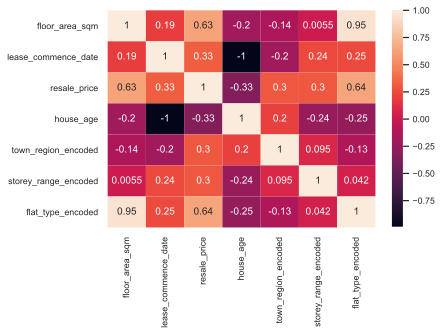

In [221]:
modeling_df_corr = hdb_df5_num.corr() 
sns.heatmap(modeling_df_corr, annot =True)

In [222]:
hdb_df5_num.corr()

,floor_area_sqm,lease_commence_date,resale_price,house_age,town_region_encoded,storey_range_encoded,flat_type_encoded
floor_area_sqm,1.00,0.19,0.63,-0.20,-0.14,0.01,0.95
lease_commence_date,0.19,1.00,0.33,-1.00,-0.20,0.24,0.25
resale_price,0.63,0.33,1.00,-0.33,0.30,0.30,0.64
house_age,-0.20,-1.00,-0.33,1.00,0.20,-0.24,-0.25
town_region_encoded,-0.14,-0.20,0.30,0.20,1.00,0.10,-0.13
storey_range_encoded,0.01,0.24,0.30,-0.24,0.10,1.00,0.04
flat_type_encoded,0.95,0.25,0.64,-0.25,-0.13,0.04,1.00


In [223]:
# sns.pairplot(hdb_df5_num)

In [224]:
df.pivot_table(index='town_region', columns = 'flat_type', values = 'resale_price',aggfunc=[np.mean, len]).round(2)

mean                                                    \
flat_type      1 ROOM    2 ROOM    3 ROOM    4 ROOM    5 ROOM EXECUTIVE   
town_region                                                               
Central     183899.14 227156.95 339023.95 603021.25 773372.25 848934.94   
East        nan       238908.33 308356.00 433102.21 541249.87 658680.13   
North       nan       222178.43 271411.84 348127.50 422578.48 561944.80   
North_East  nan       241073.36 306751.35 433590.73 508607.12 638908.04   
West        nan       236380.69 282324.80 386142.09 469787.68 581326.68   

                                len                                           \
flat_type   MULTI-GENERATION 1 ROOM 2 ROOM  3 ROOM  4 ROOM  5 ROOM EXECUTIVE   
town_region                                                                    
Central     914777.60        37.00  363.00 5465.00 5033.00 2848.00 393.00      
East        846222.22        nan    108.00 2841.00 4097.00 2783.00 1320.00     
North       760483.20        nan    168.00 2257.00 6185.00 3244.00 1192.00     
North_East  nan              nan    345.00 3715.00 8777.00 5025.00 1280.00     
West        nan              nan    178.00 4031.00 7166.00 4774.00 1814.00     

                              
flat_type   MULTI-GENERATION  
town_region                   
Central     5.00              
East        9.00              
North       20.00             
North_East  nan               
West        nan

In [225]:
modeling_variables =['town','flat_type','block','storey_range','floor_area_sqm','flat_model','lease_commence_date','remaining_lease','resale_price','house_age','town_region','town_region_encoded','storey_range_encoded','flat_type_encoded']
modeling_df = df[modeling_variables]
dummy_variable_list = ['flat_type','flat_model','town','town_region']

In [226]:
#create dummy variables 
for variable in dummy_variable_list:
    dummied_variables = pd.get_dummies(modeling_df[variable], prefix = variable, drop_first = True)
    modeling_df1 = modeling_df.join(dummied_variables)
    modeling_df = modeling_df1
    
df_dum_variables = modeling_df1.columns.values.tolist()
to_keep = [i for i in df_dum_variables if i not in dummy_variable_list]

#final data col
model_df_final = modeling_df[to_keep]
model_df_final.columns.values
model_df_final.head(1)

array(['block', 'storey_range', 'floor_area_sqm', 'lease_commence_date',
       'remaining_lease', 'resale_price', 'house_age',
       'town_region_encoded', 'storey_range_encoded', 'flat_type_encoded',
       'flat_type_2 ROOM', 'flat_type_3 ROOM', 'flat_type_4 ROOM',
       'flat_type_5 ROOM', 'flat_type_EXECUTIVE',
       'flat_type_MULTI-GENERATION', 'flat_model_Adjoined flat',
       'flat_model_Apartment', 'flat_model_DBSS', 'flat_model_Improved',
       'flat_model_Improved-Maisonette', 'flat_model_Maisonette',
       'flat_model_Model A', 'flat_model_Model A-Maisonette',
       'flat_model_Model A2', 'flat_model_Multi Generation',
       'flat_model_New Generation', 'flat_model_Premium Apartment',
       'flat_model_Premium Apartment Loft',
       'flat_model_Premium Maisonette', 'flat_model_Simplified',
       'flat_model_Standard', 'flat_model_Terrace', 'flat_model_Type S1',
       'flat_model_Type S2', 'town_BEDOK', 'town_BISHAN',
       'town_BUKIT BATOK', 'town_BUKIT MERAH

,block,storey_range,floor_area_sqm,lease_commence_date,remaining_lease,resale_price,house_age,town_region_encoded,storey_range_encoded,flat_type_encoded,flat_type_2 ROOM,flat_type_3 ROOM,flat_type_4 ROOM,flat_type_5 ROOM,flat_type_EXECUTIVE,flat_type_MULTI-GENERATION,flat_model_Adjoined flat,flat_model_Apartment,flat_model_DBSS,flat_model_Improved,flat_model_Improved-Maisonette,flat_model_Maisonette,flat_model_Model A,flat_model_Model A-Maisonette,flat_model_Model A2,flat_model_Multi Generation,flat_model_New Generation,flat_model_Premium Apartment,flat_model_Premium Apartment Loft,flat_model_Premium Maisonette,flat_model_Simplified,flat_model_Standard,flat_model_Terrace,flat_model_Type S1,flat_model_Type S2,town_BEDOK,town_BISHAN,town_BUKIT BATOK,town_BUKIT MERAH,town_BUKIT PANJANG,town_BUKIT TIMAH,town_CENTRAL AREA,town_CHOA CHU KANG,town_CLEMENTI,town_GEYLANG,town_HOUGANG,town_JURONG EAST,town_JURONG WEST,town_KALLANG/WHAMPOA,town_MARINE PARADE,town_PASIR RIS,town_PUNGGOL,town_QUEENSTOWN,town_SEMBAWANG,town_SENGKANG,town_SERANGOON,town_TAMPINES,town_TOA PAYOH,town_WOODLANDS,town_YISHUN,town_region_East,town_region_North,town_region_North_East,town_region_West
0,406,10 TO 12,44.00,1979,61,232000.00,38,3,1,2,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


# Exploratory data analysis
https://github.com/valerielimyh/Predict_housing_prices/blob/master/notebooks/03-EDA.ipynb

In [232]:
dfx = model_df_final.copy()
dfx_num = dfx.select_dtypes(include = ['float64', 'int64'])
dfx_num.columns

Index(['floor_area_sqm', 'lease_commence_date', 'resale_price', 'house_age',
       'town_region_encoded', 'storey_range_encoded', 'flat_type_encoded',
       'resale_price_log'],
      dtype='object')

# PC might hang if you run the below figure

In [233]:
# #inspect the relationship between target and numerical variables
# fig = plt.figure(figsize=(12,10))
# sns.set()
# for i in range(0, len(dfx_num.columns), 5):
#     ax = sns.pairplot(data=dfx_num,
#                 x_vars=dfx_num.columns[i:i+5],
#                 y_vars=['resale_price_log'])
# # ax.set_title('Pairplot of Asking price against features')
# plt.tight_layout()  
# # fig.savefig('../reports/figures/target_against_features.png', dpi=600)
# plt.show();

In [234]:
# #inspect the relationship between numerical features
# selected_columnns_pairplot = ['floor_area_sqm', 'lease_commence_date', 'resale_price', 'house_age',
#        'town_region_encoded', 'storey_range_encoded', 'flat_type_encoded',
#        'Asking_log', 'resale_price_log']
# sns.pairplot(dfx_num[selected_columnns_pairplot], height=1.2, aspect=1.5);

In [235]:
dfx["resale_price_log"].describe()

count   75473.00
mean    12.94   
std     0.33    
min     11.85   
25%     12.70   
50%     12.92   
75%     13.15   
max     14.02   
Name: resale_price_log, dtype: float64

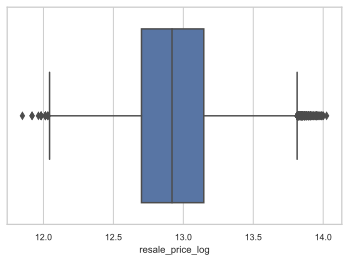

In [236]:
sns.boxplot(x=dfx["resale_price_log"]);

# Model Building
https://github.com/valerielimyh/Predict_housing_prices/blob/master/notebooks/04-Model_building.ipynb

In [347]:
dfx = model_df_final.copy()
dfx['resale_price_log'] = np.log(dfx['resale_price'])
dfx.shape
dfx.head(1)

(75473, 65)

,block,storey_range,floor_area_sqm,lease_commence_date,remaining_lease,resale_price,house_age,town_region_encoded,storey_range_encoded,flat_type_encoded,flat_type_2 ROOM,flat_type_3 ROOM,flat_type_4 ROOM,flat_type_5 ROOM,flat_type_EXECUTIVE,flat_type_MULTI-GENERATION,flat_model_Adjoined flat,flat_model_Apartment,flat_model_DBSS,flat_model_Improved,flat_model_Improved-Maisonette,flat_model_Maisonette,flat_model_Model A,flat_model_Model A-Maisonette,flat_model_Model A2,flat_model_Multi Generation,flat_model_New Generation,flat_model_Premium Apartment,flat_model_Premium Apartment Loft,flat_model_Premium Maisonette,flat_model_Simplified,flat_model_Standard,flat_model_Terrace,flat_model_Type S1,flat_model_Type S2,town_BEDOK,town_BISHAN,town_BUKIT BATOK,town_BUKIT MERAH,town_BUKIT PANJANG,town_BUKIT TIMAH,town_CENTRAL AREA,town_CHOA CHU KANG,town_CLEMENTI,town_GEYLANG,town_HOUGANG,town_JURONG EAST,town_JURONG WEST,town_KALLANG/WHAMPOA,town_MARINE PARADE,town_PASIR RIS,town_PUNGGOL,town_QUEENSTOWN,town_SEMBAWANG,town_SENGKANG,town_SERANGOON,town_TAMPINES,town_TOA PAYOH,town_WOODLANDS,town_YISHUN,town_region_East,town_region_North,town_region_North_East,town_region_West,resale_price_log
0,406,10 TO 12,44.00,1979,61,232000.00,38,3,1,2,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,12.35


In [348]:
df_OLS_evaluated  = dfx.drop(columns = ['block','storey_range','town_region_encoded','flat_type_encoded','resale_price'])

In [349]:
X = df_OLS_evaluated .drop('resale_price_log',axis = 1).astype(float)
y = df_OLS_evaluated ['resale_price_log'].astype(float)

#Split the data 60 - 20 - 20 train/val/test

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2,random_state=seed)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=.25, random_state=seed)

In [351]:
selected_ols_model_log_price = sm.OLS(y_train, sm.add_constant(X_train))
selected_ols_results_log_price = selected_ols_model_log_price.fit()

selected_ols_results_log_price.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       resale_price_log   R-squared:                       0.876
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     5928.
Date:                Sun, 18 Oct 2020   Prob (F-statistic):               0.00
Time:                        17:39:29   Log-Likelihood:                 33249.
No. Observations:               45283   AIC:                        -6.639e+04
Df Residuals:                   45228   BIC:                        -6.591e+04
Df Model:                          54                                         
Covariance Type:            nonrobust                                         
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                                15.1097      1.004     15.042      0.000      13.141      17.079
floor_area_sqm                        0.0076      0.000     74.614      0.000       0.007       0.008
lease_commence_date                  -0.0024      0.001     -4.370      0.000      -0.003      -0.001
remaining_lease                       0.0067      0.001      5.990      0.000       0.005       0.009
house_age                            -0.0064      0.001     -5.440      0.000      -0.009      -0.004
storey_range_encoded                  0.0129      0.000     46.067      0.000       0.012       0.013
flat_type_2 ROOM                      0.1733      0.028      6.190      0.000       0.118       0.228
flat_type_3 ROOM                      0.3424      0.028     12.308      0.000       0.288       0.397
flat_type_4 ROOM                      0.4409      0.028     15.565      0.000       0.385       0.496
flat_type_5 ROOM                      0.4794      0.029     16.482      0.000       0.422       0.536
flat_type_EXECUTIVE                   0.4788      0.030     15.920      0.000       0.420       0.538
flat_type_MULTI-GENERATION            0.3342      0.062      5.416      0.000       0.213       0.455
flat_model_Adjoined flat              0.0800      0.117      0.684      0.494      -0.149       0.309
flat_model_Apartment                  0.0488      0.116      0.419      0.675      -0.179       0.277
flat_model_DBSS                       0.1881      0.116      1.616      0.106      -0.040       0.416
flat_model_Improved                  -0.0213      0.116     -0.183      0.855      -0.249       0.207
flat_model_Improved-Maisonette        0.2777      0.123      2.251      0.024       0.036       0.520
flat_model_Maisonette                 0.0910      0.116      0.781      0.435      -0.137       0.319
flat_model_Model A                   -0.0160      0.116     -0.138      0.890      -0.244       0.212
flat_model_Model A-Maisonette         0.1553      0.117      1.326      0.185      -0.074       0.385
flat_model_Model A2                  -0.0412      0.116     -0.354      0.724      -0.269       0.187
flat_model_Multi Generation           0.3342      0.062      5.416      0.000       0.213       0.455
flat_model_New Generation             0.0159      0.116      0.137      0.891      -0.212       0.244
flat_model_Premium Apartment          0.0045      0.116      0.039      0.969      -0.223       0.232
flat_model_Premium Apartment Loft     0.1194      0.120      0.994      0.320      -0.116       0.355
flat_model_Premium Maisonette         0.0086      0.126      0.068      0.945      -0.238       0.255
flat_model_Simplified                -0.0086      0.116     -0.074      0.941      -0.237       0.219
flat_model_Standard    

In [352]:
# This step fits the Standard Scaler to the training data

std = StandardScaler()
std.fit(X_train.values)

# This step applies the scaler to the train set.
X_train_scaled = std.transform(X_train.values) 

# This step applies the scaler to the validation set.
X_val_scaled = std.transform(X_val.values)

## Apply the scaler to the test set
X_test_scaled = std.transform(X_test.values)

# This step fits the Standard Scaler to the train_val data

std = StandardScaler()
std.fit(X_train_val.values)

# This step applies the scaler to the train_val set.
X_train_val_scaled = std.transform(X_train_val.values)

StandardScaler()

StandardScaler()

In [353]:
# Run the cross validation, find the best alpha
alphavec = 10**np.linspace(-2,2,200)
lasso_model = LassoCV(alphas = alphavec, cv=5)
lasso_model.fit(X_train_scaled, y_train)

# This is the best alpha value it found 
lasso_model.alpha_

LassoCV(alphas=array([1.00000000e-02, 1.04737090e-02, 1.09698580e-02, 1.14895100e-02,
       1.20337784e-02, 1.26038293e-02, 1.32008840e-02, 1.38262217e-02,
       1.44811823e-02, 1.51671689e-02, 1.58856513e-02, 1.66381689e-02,
       1.74263339e-02, 1.82518349e-02, 1.91164408e-02, 2.00220037e-02,
       2.09704640e-02, 2.19638537e-02, 2.30043012e-02, 2.40940356e-02,
       2.52353917e-02, 2.64308149e-0...
       3.44896226e+01, 3.61234270e+01, 3.78346262e+01, 3.96268864e+01,
       4.15040476e+01, 4.34701316e+01, 4.55293507e+01, 4.76861170e+01,
       4.99450512e+01, 5.23109931e+01, 5.47890118e+01, 5.73844165e+01,
       6.01027678e+01, 6.29498899e+01, 6.59318827e+01, 6.90551352e+01,
       7.23263390e+01, 7.57525026e+01, 7.93409667e+01, 8.30994195e+01,
       8.70359136e+01, 9.11588830e+01, 9.54771611e+01, 1.00000000e+02]),
        cv=5)

0.01

In [354]:
## Fit a LASSO model on the standardized data

lasso_model_1 = Lasso(lasso_model.alpha_)
lasso_model_1.fit(X_train_scaled, y_train)

Lasso(alpha=0.01)

In [326]:
list_of_feature_impt_lasso_1 = sorted(list(zip(X_train.columns, lasso_model_1.coef_.round(5))),key=lambda x: x[1], reverse = True)
list_of_feature_impt_lasso_1

[('floor_area_sqm', 0.2136),
 ('town_BUKIT MERAH', 0.04511),
 ('town_QUEENSTOWN', 0.03692),
 ('remaining_lease', 0.03497),
 ('storey_range_encoded', 0.03194),
 ('flat_model_DBSS', 0.03187),
 ('town_CLEMENTI', 0.02912),
 ('town_BISHAN', 0.02586),
 ('town_CENTRAL AREA', 0.02416),
 ('town_KALLANG/WHAMPOA', 0.018),
 ('town_MARINE PARADE', 0.01749),
 ('town_BUKIT TIMAH', 0.01198),
 ('town_TOA PAYOH', 0.01008),
 ('town_GEYLANG', 0.00615),
 ('flat_model_Terrace', 0.00273),
 ('flat_model_Type S1', 0.00249),
 ('flat_model_Maisonette', 0.00222),
 ('lease_commence_date', 0.0),
 ('flat_type_4 ROOM', 0.0),
 ('flat_type_5 ROOM', 0.0),
 ('flat_type_EXECUTIVE', 0.0),
 ('flat_type_MULTI-GENERATION', 0.0),
 ('flat_model_Adjoined flat', 0.0),
 ('flat_model_Apartment', 0.0),
 ('flat_model_Improved', -0.0),
 ('flat_model_Improved-Maisonette', 0.0),
 ('flat_model_Model A', -0.0),
 ('flat_model_Model A-Maisonette', 0.0),
 ('flat_model_Model A2', -0.0),
 ('flat_model_Multi Generation', 0.0),
 ('flat_model_New

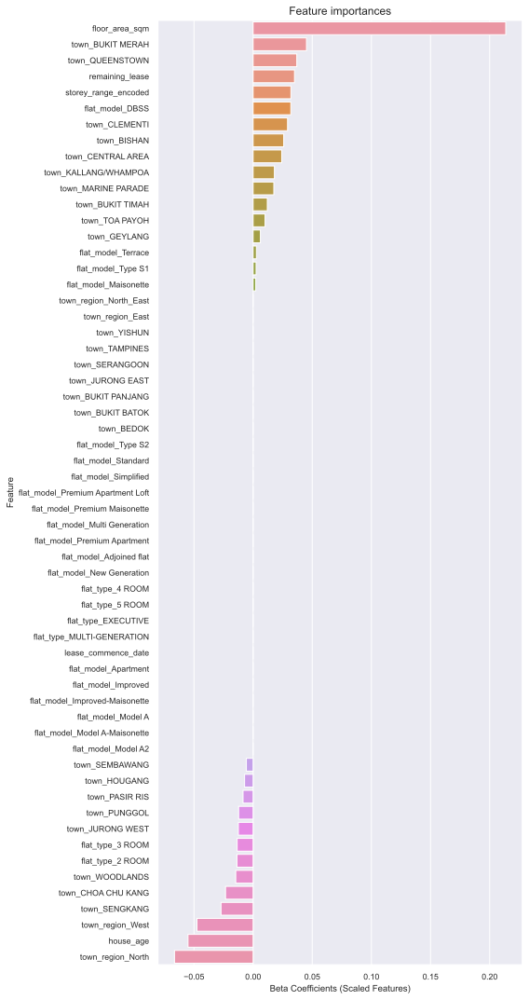

In [355]:
list_of_feature_impt_lasso_1_df = pd.DataFrame(list_of_feature_impt_lasso_1, columns =['Feature', 'Importance']) 
plt.figure(figsize=(8, 15))
sns.set(style = "whitegrid", color_codes=True)
sns.set(font_scale=0.8)
list_of_feature_impt_lasso_1_df.sort_values('Importance',inplace=True, ascending = False)

ax = sns.barplot(x='Importance', y='Feature', data=list_of_feature_impt_lasso_1_df)
ax.set_title("Feature importances", fontsize=12)
ax.set_xlabel("Beta Coefficients (Scaled Features)")
plt.tight_layout()
plt.show();

<b>least-angle regression (LARS) is an algorithm for fitting linear regression models to high-dimensional data<b>

Computing regularization path using the LARS ...


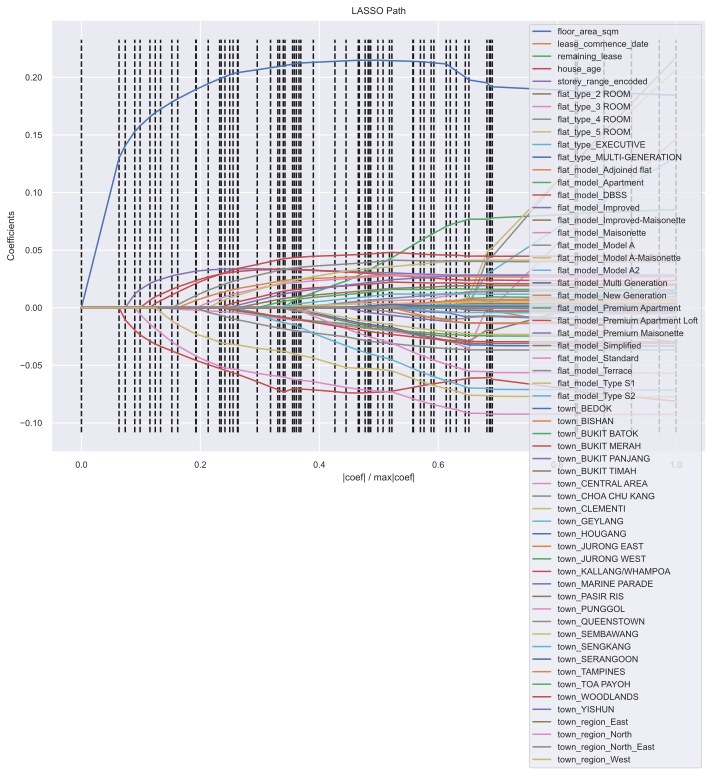

In [356]:
print("Computing regularization path using the LARS ...")
alphas, _, coefs = lars_path(X_train_scaled, y_train, method='lasso')
# plotting the LARS path

xx = np.sum(np.abs(coefs.T), axis=1)
xx /= xx[-1]

plt.figure(figsize=(10,10))
plt.plot(xx, coefs.T)
ymin, ymax = plt.ylim()
plt.vlines(xx, ymin, ymax, linestyle='dashed')
plt.xlabel('|coef| / max|coef|')
plt.ylabel('Coefficients')
plt.title('LASSO Path')
plt.axis('tight')
plt.legend(X_train.columns)
plt.tight_layout()
plt.show();

In [363]:
df_2 = df_OLS_evaluated[['floor_area_sqm',
                        'town_BUKIT MERAH',
                        'town_QUEENSTOWN',
                        'remaining_lease',
                        'storey_range_encoded',
                        'flat_model_DBSS',
                        'town_CLEMENTI',
                        'town_BISHAN',
                        'town_CENTRAL AREA',
                        'town_KALLANG/WHAMPOA',
                        'town_MARINE PARADE',
                        'town_BUKIT TIMAH',
                        'town_TOA PAYOH',
                        'town_GEYLANG',
                        'flat_model_Terrace',
                        'flat_model_Type S1',
                        'flat_model_Maisonette',
                        'town_SEMBAWANG',
                        'town_HOUGANG',
                        'town_PASIR RIS',
                        'town_PUNGGOL',
                        'town_JURONG WEST',
                        'flat_type_3 ROOM',
                        'flat_type_2 ROOM',
                        'town_WOODLANDS',
                        'town_CHOA CHU KANG',
                        'town_SENGKANG',
                        'town_region_West',
                        'house_age',
                        'town_region_North',
                        'resale_price_log']]

In [364]:
X_2 = df_2.drop(columns = ['resale_price_log'])
y_2 = df_2['resale_price_log']
#Split the data 60 - 20 - 20 train/val/test
X_train_val_2, X_test_2, y_train_val_2, y_test_2 = train_test_split(X_2, y_2, test_size=0.2,random_state=seed)
X_train_2, X_val_2, y_train_2, y_val_2 = train_test_split(X_train_val_2, y_train_val_2, test_size=.25, random_state=seed)

In [365]:
# This step fits the Standard Scaler to the training data

std = StandardScaler()
std.fit(X_train_2.values)

# This step applies the scaler to the train set.
X_train_scaled_2 = std.transform(X_train_2.values) 

# This step applies the scaler to the validation set.
X_val_scaled_2 = std.transform(X_val_2.values)

## Apply the scaler to the test set
X_test_scaled_2 = std.transform(X_test_2.values)

# This step fits the Standard Scaler to the train_val data

std = StandardScaler()
std.fit(X_train_val_2.values)

# This step applies the scaler to the train_val set.
X_train_val_scaled_2 = std.transform(X_train_val_2.values)

StandardScaler()

StandardScaler()

In [366]:
# Run the cross validation, find the best alpha for LassoCV
alphavec = 10**np.linspace(-2,2,200)
lasso_model_2 = LassoCV(alphas = alphavec, cv=5)
lasso_model_2.fit(X_train_scaled_2, y_train_2)

# This is the best alpha value it found 
lasso_model_2.alpha_
##lasso regularisation didnt add a significant penalty term to cost function

LassoCV(alphas=array([1.00000000e-02, 1.04737090e-02, 1.09698580e-02, 1.14895100e-02,
       1.20337784e-02, 1.26038293e-02, 1.32008840e-02, 1.38262217e-02,
       1.44811823e-02, 1.51671689e-02, 1.58856513e-02, 1.66381689e-02,
       1.74263339e-02, 1.82518349e-02, 1.91164408e-02, 2.00220037e-02,
       2.09704640e-02, 2.19638537e-02, 2.30043012e-02, 2.40940356e-02,
       2.52353917e-02, 2.64308149e-0...
       3.44896226e+01, 3.61234270e+01, 3.78346262e+01, 3.96268864e+01,
       4.15040476e+01, 4.34701316e+01, 4.55293507e+01, 4.76861170e+01,
       4.99450512e+01, 5.23109931e+01, 5.47890118e+01, 5.73844165e+01,
       6.01027678e+01, 6.29498899e+01, 6.59318827e+01, 6.90551352e+01,
       7.23263390e+01, 7.57525026e+01, 7.93409667e+01, 8.30994195e+01,
       8.70359136e+01, 9.11588830e+01, 9.54771611e+01, 1.00000000e+02]),
        cv=5)

0.01

In [367]:

## Fit a LASSO model on the standardized data

lasso_model_2 = Lasso(lasso_model_2.alpha_)
lasso_model_2.fit(X_train_scaled_2, y_train_2)

Lasso(alpha=0.01)

In [368]:

list_of_feature_impt_lasso_2 = sorted(list(zip(X_train_2.columns, lasso_model_2.coef_.round(5))),key=lambda x: x[1], reverse = True)
list_of_feature_impt_lasso_2

[('floor_area_sqm', 0.21358),
 ('town_BUKIT MERAH', 0.0451),
 ('town_QUEENSTOWN', 0.03692),
 ('remaining_lease', 0.03206),
 ('storey_range_encoded', 0.03194),
 ('flat_model_DBSS', 0.03188),
 ('town_CLEMENTI', 0.02912),
 ('town_BISHAN', 0.02586),
 ('town_CENTRAL AREA', 0.02416),
 ('town_KALLANG/WHAMPOA', 0.018),
 ('town_MARINE PARADE', 0.01748),
 ('town_BUKIT TIMAH', 0.01198),
 ('town_TOA PAYOH', 0.01007),
 ('town_GEYLANG', 0.00615),
 ('flat_model_Terrace', 0.00273),
 ('flat_model_Type S1', 0.00249),
 ('flat_model_Maisonette', 0.00223),
 ('town_SEMBAWANG', -0.0057),
 ('town_HOUGANG', -0.00721),
 ('town_PASIR RIS', -0.00852),
 ('town_PUNGGOL', -0.01224),
 ('town_JURONG WEST', -0.0125),
 ('flat_type_3 ROOM', -0.01353),
 ('flat_type_2 ROOM', -0.01367),
 ('town_WOODLANDS', -0.01469),
 ('town_CHOA CHU KANG', -0.02333),
 ('town_SENGKANG', -0.02713),
 ('town_region_West', -0.04746),
 ('house_age', -0.05796),
 ('town_region_North', -0.06648)]

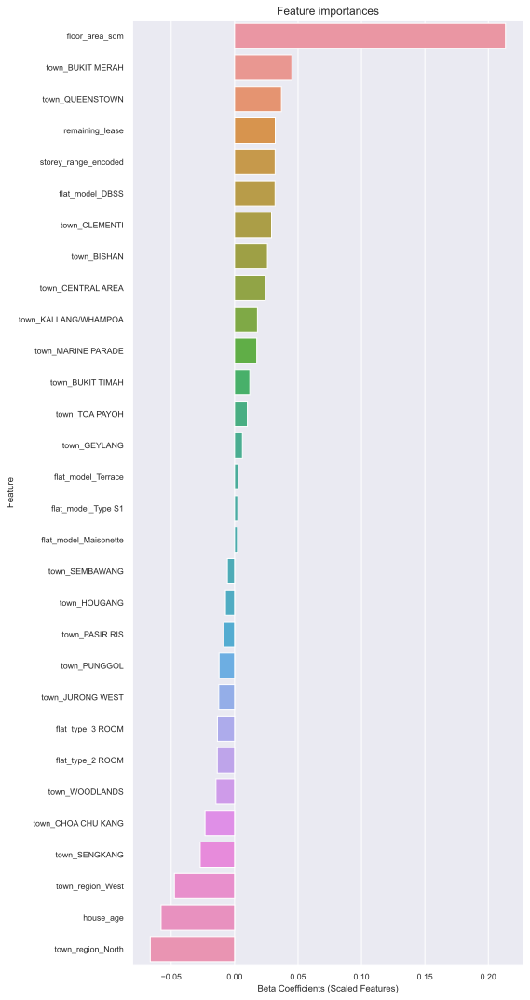

In [369]:
list_of_feature_impt_lasso_2_df = pd.DataFrame(list_of_feature_impt_lasso_2, columns =['Feature', 'Importance']) 
plt.figure(figsize=(8, 15))
sns.set(style = "whitegrid", color_codes=True)
sns.set(font_scale=0.8)
list_of_feature_impt_lasso_2_df.sort_values('Importance',inplace=True, ascending = False)

ax = sns.barplot(x='Importance', y='Feature', data=list_of_feature_impt_lasso_2_df)
ax.set_title("Feature importances", fontsize=12)
ax.set_xlabel("Beta Coefficients (Scaled Features)")
plt.tight_layout()
plt.show();

Computing regularization path using the LARS ...


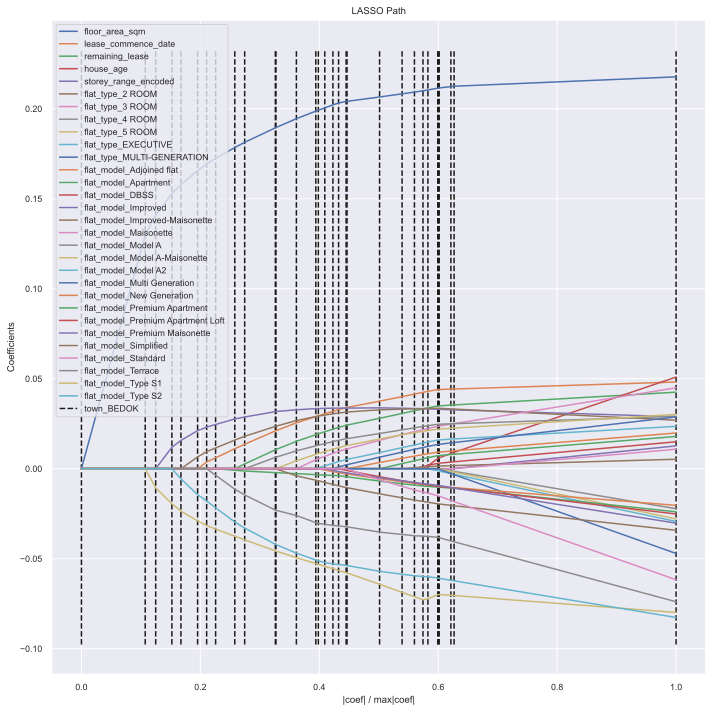

In [370]:

print("Computing regularization path using the LARS ...")
alphas, _, coefs = lars_path(X_train_scaled_2, y_train_2, method='lasso')
# plotting the LARS path

xx = np.sum(np.abs(coefs.T), axis=1)
xx /= xx[-1]

plt.figure(figsize=(10,10))
plt.plot(xx, coefs.T)
ymin, ymax = plt.ylim()
plt.vlines(xx, ymin, ymax, linestyle='dashed')
plt.xlabel('|coef| / max|coef|')
plt.ylabel('Coefficients')
plt.title('LASSO Path')
plt.axis('tight')
plt.legend(X_train.columns)
plt.tight_layout()
plt.show();

In [373]:
dfx3 = df_2[['floor_area_sqm',
            'remaining_lease',
            'storey_range_encoded',
            'flat_model_DBSS',
            'flat_model_Terrace',
            'flat_model_Type S1',
            'flat_model_Maisonette',
            'flat_type_3 ROOM',
            'flat_type_2 ROOM',
            'house_age',
            'resale_price_log']]

X_3 = dfx3.drop(columns = ['resale_price_log'])
y_3 = dfx3['resale_price_log']
#Split the data 60 - 20 - 20 train/val/test
X_train_val_3, X_test_3, y_train_val_3, y_test_3 = train_test_split(X_3, y_3, test_size=0.2,random_state=seed)
X_train_3, X_val_3, y_train_3, y_val_3 = train_test_split(X_train_val_3, y_train_val_3, test_size=.25, random_state=seed)

In [374]:
# This step fits the Standard Scaler to the training data

std = StandardScaler()
std.fit(X_train_3.values)

# This step applies the scaler to the train set.
X_train_scaled_3 = std.transform(X_train_3.values) 

# This step applies the scaler to the validation set.
X_val_scaled_3 = std.transform(X_val_3.values)

## Apply the scaler to the test set
X_test_scaled_3 = std.transform(X_test_3.values)

# This step fits the Standard Scaler to the train_val data

std = StandardScaler()
std.fit(X_train_val_3.values)

# This step applies the scaler to the train_val set.
X_train_val_scaled_3 = std.transform(X_train_val_3.values)

StandardScaler()

StandardScaler()

In [375]:
# Run the cross validation, find the best alpha for LassoCV
alphavec = 10**np.linspace(-2,2,200)
lasso_model_3 = LassoCV(alphas = alphavec, cv=5)
lasso_model_3.fit(X_train_scaled_3, y_train_3)

# This is the best alpha value it found 
lasso_model_3.alpha_
##lasso regularisation didnt add a significant penalty term to cost function

LassoCV(alphas=array([1.00000000e-02, 1.04737090e-02, 1.09698580e-02, 1.14895100e-02,
       1.20337784e-02, 1.26038293e-02, 1.32008840e-02, 1.38262217e-02,
       1.44811823e-02, 1.51671689e-02, 1.58856513e-02, 1.66381689e-02,
       1.74263339e-02, 1.82518349e-02, 1.91164408e-02, 2.00220037e-02,
       2.09704640e-02, 2.19638537e-02, 2.30043012e-02, 2.40940356e-02,
       2.52353917e-02, 2.64308149e-0...
       3.44896226e+01, 3.61234270e+01, 3.78346262e+01, 3.96268864e+01,
       4.15040476e+01, 4.34701316e+01, 4.55293507e+01, 4.76861170e+01,
       4.99450512e+01, 5.23109931e+01, 5.47890118e+01, 5.73844165e+01,
       6.01027678e+01, 6.29498899e+01, 6.59318827e+01, 6.90551352e+01,
       7.23263390e+01, 7.57525026e+01, 7.93409667e+01, 8.30994195e+01,
       8.70359136e+01, 9.11588830e+01, 9.54771611e+01, 1.00000000e+02]),
        cv=5)

0.01

In [376]:
## Fit a LASSO model on the standardized data

lasso_model_3 = Lasso(lasso_model_3.alpha_)
lasso_model_3.fit(X_train_scaled_3, y_train_3)

Lasso(alpha=0.01)

In [377]:
list_of_feature_impt_lasso_3 = sorted(list(zip(X_train_3.columns, lasso_model_3.coef_.round(5))),key=lambda x: x[1], reverse = True)
list_of_feature_impt_lasso_3

[('floor_area_sqm', 0.1893),
 ('storey_range_encoded', 0.05858),
 ('flat_model_DBSS', 0.04523),
 ('flat_model_Type S1', 0.01546),
 ('flat_model_Maisonette', 0.00987),
 ('flat_model_Terrace', 0.0066),
 ('remaining_lease', 0.0),
 ('flat_type_2 ROOM', -0.01474),
 ('flat_type_3 ROOM', -0.01723),
 ('house_age', -0.04883)]

Computing regularization path using the LARS ...


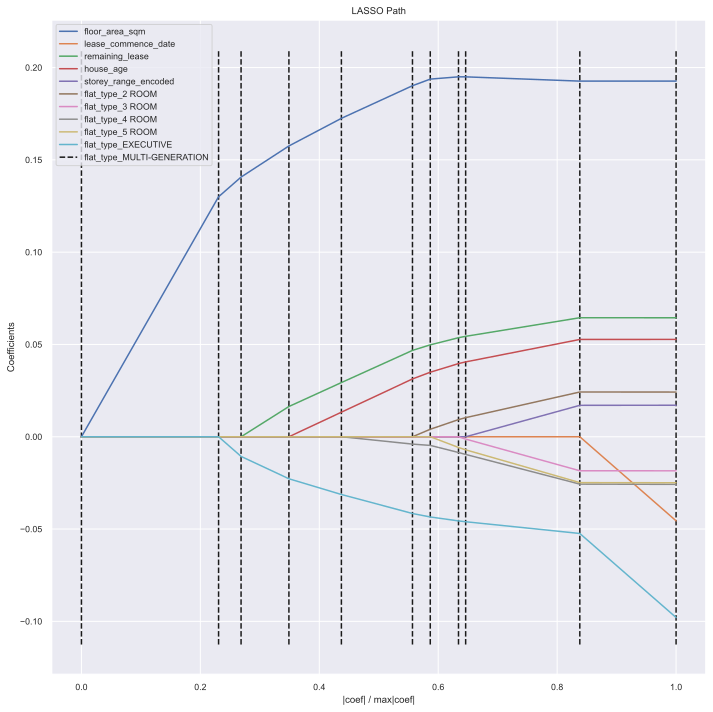

In [344]:
print("Computing regularization path using the LARS ...")
alphas, _, coefs = lars_path(X_train_scaled_3, y_train_3, method='lasso')
# plotting the LARS path

xx = np.sum(np.abs(coefs.T), axis=1)
xx /= xx[-1]

plt.figure(figsize=(10,10))
plt.plot(xx, coefs.T)
ymin, ymax = plt.ylim()
plt.vlines(xx, ymin, ymax, linestyle='dashed')
plt.xlabel('|coef| / max|coef|')
plt.ylabel('Coefficients')
plt.title('LASSO Path')
plt.axis('tight')
plt.legend(X_train.columns)
plt.tight_layout()
plt.show();

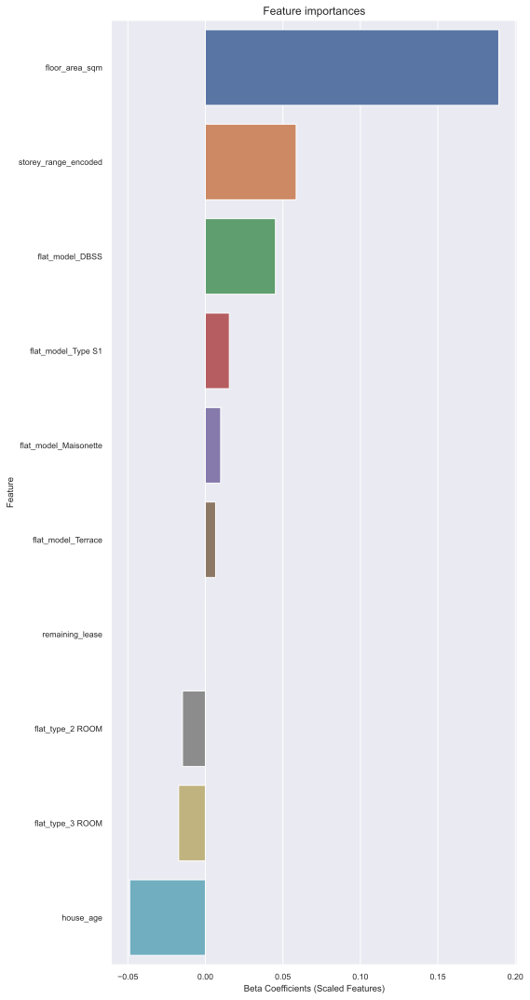

In [378]:
list_of_feature_impt_lasso_3_df = pd.DataFrame(list_of_feature_impt_lasso_3, columns =['Feature', 'Importance']) 
plt.figure(figsize=(8, 15))
sns.set(style = "whitegrid", color_codes=True)
sns.set(font_scale=0.8)
list_of_feature_impt_lasso_3_df.sort_values('Importance',inplace=True, ascending = False)

ax = sns.barplot(x='Importance', y='Feature', data=list_of_feature_impt_lasso_3_df)
ax.set_title("Feature importances", fontsize=12)
ax.set_xlabel("Beta Coefficients (Scaled Features)")
plt.tight_layout()
plt.show();

In [379]:
ols_model_log_price_3 = sm.OLS(y_train, sm.add_constant(X_train_3))
ols_results_log_price_3 = ols_model_log_price_3.fit()

ols_results_log_price_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       resale_price_log   R-squared:                       0.629
Model:                            OLS   Adj. R-squared:                  0.629
Method:                 Least Squares   F-statistic:                     7689.
Date:                Sun, 18 Oct 2020   Prob (F-statistic):               0.00
Time:                        17:47:56   Log-Likelihood:                 8422.8
No. Observations:               45283   AIC:                        -1.682e+04
Df Residuals:                   45272   BIC:                        -1.673e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    12.6348      0.187     67.567      0.000      12.268      13.001
floor_area_sqm            0.0075    6.6e-05    113.434      0.000       0.007       0.008
remaining_lease          -0.0043      0.002     -2.259      0.024      -0.008      -0.001
storey_range_encoded      0.0308      0.000     66.570      0.000       0.030       0.032
flat_model_DBSS           0.4217      0.008     55.038      0.000       0.407       0.437
flat_model_Terrace        0.6875      0.037     18.628      0.000       0.615       0.760
flat_model_Type S1        0.5782      0.023     25.357      0.000       0.534       0.623
flat_model_Maisonette     0.1296      0.006     20.806      0.000       0.117       0.142
flat_type_3 ROOM         -0.0682      0.004    -18.782      0.000      -0.075      -0.061
flat_type_2 ROOM         -0.2244      0.009    -25.510      0.000      -0.242      -0.207
house_age                -0.0085      0.002     -4.471      0.000      -0.012      -0.005
==============================================================================
Omnibus:                     3564.135   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4460.275
Skew:                           0.747   Prob(JB):                         0.00
Kurtosis:                       3.360   Cond. No.                     2.51e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.51e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [380]:
df_5 = dfx3[['floor_area_sqm',
            'storey_range_encoded',
            'flat_model_DBSS',
            'flat_model_Terrace',
            'flat_model_Type S1',
            'flat_model_Maisonette',
            'flat_type_3 ROOM',
            'flat_type_2 ROOM',
            'house_age',
            'resale_price_log']]


In [381]:
X_5 = df_5.drop('resale_price_log',axis = 1).astype(float)
y = df_5['resale_price_log'].astype(float)

#Split the data 60 - 20 - 20 train/val/test

X_train_val_5, X_test_5, y_train_val, y_test = train_test_split(X_5, y, test_size=0.2,random_state=seed)
X_train_5, X_val_5, y_train, y_val = train_test_split(X_train_val_5, y_train_val, test_size=.25, random_state=seed)

In [382]:

ols_model_log_price_5 = sm.OLS(y_train, sm.add_constant(X_train_5))
ols_results_log_price_5 = ols_model_log_price_5.fit()

ols_results_log_price_5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       resale_price_log   R-squared:                       0.629
Model:                            OLS   Adj. R-squared:                  0.629
Method:                 Least Squares   F-statistic:                     8541.
Date:                Sun, 18 Oct 2020   Prob (F-statistic):               0.00
Time:                        17:48:24   Log-Likelihood:                 8420.3
No. Observations:               45283   AIC:                        -1.682e+04
Df Residuals:                   45273   BIC:                        -1.673e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    12.2128      0.007   1630.534      0.000      12.198      12.227
floor_area_sqm            0.0075    6.6e-05    113.423      0.000       0.007       0.008
storey_range_encoded      0.0308      0.000     66.646      0.000       0.030       0.032
flat_model_DBSS           0.4218      0.008     55.044      0.000       0.407       0.437
flat_model_Terrace        0.6871      0.037     18.616      0.000       0.615       0.759
flat_model_Type S1        0.5802      0.023     25.459      0.000       0.536       0.625
flat_model_Maisonette     0.1296      0.006     20.804      0.000       0.117       0.142
flat_type_3 ROOM         -0.0680      0.004    -18.725      0.000      -0.075      -0.061
flat_type_2 ROOM         -0.2241      0.009    -25.477      0.000      -0.241      -0.207
house_age                -0.0042    8.6e-05    -48.864      0.000      -0.004      -0.004
==============================================================================
Omnibus:                     3577.306   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4480.427
Skew:                           0.749   Prob(JB):                         0.00
Kurtosis:                       3.363   Cond. No.                     4.04e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.04e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [383]:
# This step fits the Standard Scaler to the training data

std = StandardScaler()
std.fit(X_train_5.values)

# This step applies the scaler to the train set.
X_train_scaled_5 = std.transform(X_train_5.values) 

# This step applies the scaler to the validation set.
X_val_scaled_5 = std.transform(X_val_5.values)

## Apply the scaler to the test set
X_test_scaled_5 = std.transform(X_test_5.values)

# This step fits the Standard Scaler to the train_val data

std = StandardScaler()
std.fit(X_train_val_5.values)

# This step applies the scaler to the train_val set.
X_train_val_scaled_5 = std.transform(X_train_val_5.values)

StandardScaler()

StandardScaler()

In [384]:
# Run the cross validation, find the best alpha for LassoCV
alphavec = 10**np.linspace(-2,2,200)
lasso_model_5 = LassoCV(alphas = alphavec, cv=5)
lasso_model_5.fit(X_train_scaled_5, y_train)

# This is the best alpha value it found 
lasso_model_5.alpha_
##lasso regularisation didnt add a significant penalty term to cost function

LassoCV(alphas=array([1.00000000e-02, 1.04737090e-02, 1.09698580e-02, 1.14895100e-02,
       1.20337784e-02, 1.26038293e-02, 1.32008840e-02, 1.38262217e-02,
       1.44811823e-02, 1.51671689e-02, 1.58856513e-02, 1.66381689e-02,
       1.74263339e-02, 1.82518349e-02, 1.91164408e-02, 2.00220037e-02,
       2.09704640e-02, 2.19638537e-02, 2.30043012e-02, 2.40940356e-02,
       2.52353917e-02, 2.64308149e-0...
       3.44896226e+01, 3.61234270e+01, 3.78346262e+01, 3.96268864e+01,
       4.15040476e+01, 4.34701316e+01, 4.55293507e+01, 4.76861170e+01,
       4.99450512e+01, 5.23109931e+01, 5.47890118e+01, 5.73844165e+01,
       6.01027678e+01, 6.29498899e+01, 6.59318827e+01, 6.90551352e+01,
       7.23263390e+01, 7.57525026e+01, 7.93409667e+01, 8.30994195e+01,
       8.70359136e+01, 9.11588830e+01, 9.54771611e+01, 1.00000000e+02]),
        cv=5)

0.01

In [385]:
##lasso regularisation didnt add a significant penalty term to cost function
## Fit a LASSO model on the standardized data

lasso_model_5 = Lasso(lasso_model_5.alpha_)
lasso_model_5.fit(X_train_scaled_5, y_train)

Lasso(alpha=0.01)

In [386]:
list_of_feature_impt_lasso_5 = sorted(list(zip(X_train_5.columns, lasso_model_5.coef_.round(5))),key=lambda x: x[1], reverse = True)
list_of_feature_impt_lasso_5

[('floor_area_sqm', 0.18936),
 ('storey_range_encoded', 0.05858),
 ('flat_model_DBSS', 0.04523),
 ('flat_model_Type S1', 0.01546),
 ('flat_model_Maisonette', 0.00986),
 ('flat_model_Terrace', 0.00659),
 ('flat_type_2 ROOM', -0.01472),
 ('flat_type_3 ROOM', -0.01718),
 ('house_age', -0.04884)]

In [387]:
X_val_5_add_c = sm.add_constant(X_val_5)
val_pred_ols_5 = ols_results_log_price_5.predict(X_val_5_add_c).clip(12.25, 13.96) 

print('OLS model on test data RMSE: {:f}'.format(
    sqrt(mean_squared_error(y_val, val_pred_ols_5))))
print('OLS model on test data MAE: {:f}'.format(
    mean_absolute_error(y_val, val_pred_ols_5)))
print('OLS model on test data RMSE (after reversing log): {:f}'.format(
    sqrt(mean_squared_error(np.exp(y_val), np.exp(val_pred_ols_5)))) )
print('OLS model on test data MSE (after reversing log): {:f}'.format(
    mean_absolute_error(np.exp(y_val), np.exp(val_pred_ols_5))))

OLS model on test data RMSE: 0.199930
OLS model on test data MAE: 0.157401
OLS model on test data RMSE (after reversing log): 99622.905873
OLS model on test data MSE (after reversing log): 71246.864527


In [388]:
ols_model_log_price_5_full = sm.OLS(y_train_val, sm.add_constant(X_train_val_5))
ols_results_log_price_5_full = ols_model_log_price_5_full.fit()
ols_results_log_price_5_full.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       resale_price_log   R-squared:                       0.628
Model:                            OLS   Adj. R-squared:                  0.628
Method:                 Least Squares   F-statistic:                 1.131e+04
Date:                Sun, 18 Oct 2020   Prob (F-statistic):               0.00
Time:                        17:49:00   Log-Likelihood:                 11302.
No. Observations:               60378   AIC:                        -2.258e+04
Df Residuals:                   60368   BIC:                        -2.249e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    12.2138      0.007   1877.370      0.000      12.201      12.227
floor_area_sqm            0.0074   5.75e-05    129.668      0.000       0.007       0.008
storey_range_encoded      0.0311      0.000     77.559      0.000       0.030       0.032
flat_model_DBSS           0.4205      0.007     63.236      0.000       0.408       0.434
flat_model_Terrace        0.7252      0.032     22.459      0.000       0.662       0.788
flat_model_Type S1        0.5812      0.019     30.271      0.000       0.544       0.619
flat_model_Maisonette     0.1259      0.005     23.309      0.000       0.115       0.136
flat_type_3 ROOM         -0.0686      0.003    -21.884      0.000      -0.075      -0.062
flat_type_2 ROOM         -0.2262      0.008    -29.973      0.000      -0.241      -0.211
house_age                -0.0042   7.44e-05    -55.892      0.000      -0.004      -0.004
==============================================================================
Omnibus:                     4856.168   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6108.165
Skew:                           0.756   Prob(JB):                         0.00
Kurtosis:                       3.378   Cond. No.                     4.08e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.08e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [389]:
X_test_5_add_c = sm.add_constant(X_test_5)
test_pred_ols_5 = ols_results_log_price_5_full.predict(X_test_5_add_c).clip(12.25, 13.96) 
print('OLS model on test data RMSE: {:f}'.format(
    sqrt(mean_squared_error(y_test, test_pred_ols_5))))
print('OLS model on test data MAE: {:f}'.format(
    mean_absolute_error(y_test, test_pred_ols_5)))
print('OLS model on test data RMSE (after reversing log): {:f}'.format(
    sqrt(mean_squared_error(np.exp(y_test), np.exp(test_pred_ols_5)))) )
print('OLS model on test data MSE (afte reversing log): {:f}'.format(
    mean_absolute_error(np.exp(y_test), np.exp(test_pred_ols_5))))

OLS model on test data RMSE: 0.201100
OLS model on test data MAE: 0.158032
OLS model on test data RMSE (after reversing log): 100295.160854
OLS model on test data MSE (afte reversing log): 71625.601945


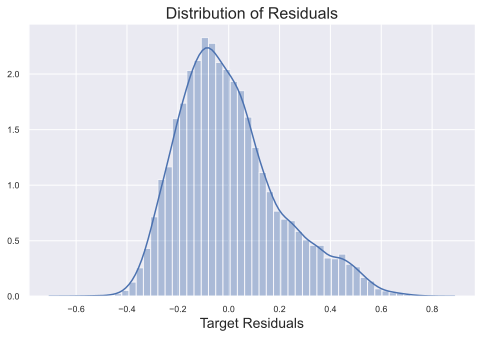

In [390]:
ols_test_residual_5 = y_test - test_pred_ols_5
# Plot distribution of residuals
plt.figure(figsize=(8, 5))
sns.distplot(ols_test_residual_5)
plt.xlabel('Target Residuals', size=14)
sns.despine()
plt.title('Distribution of Residuals', size=16)
# plt.savefig('../reports/figures/residual_distribution_appendix.png')
plt.show();

In [391]:
plt.figure(figsize=(20, 6))
plt.subplot(1, 3, 1)
plt.scatter(test_pred_ols_5, ols_test_residual_5)
sns.despine()
plt.plot([12.4, 13.96], [0, 0], '--', color='coral')
plt.title("OLS Residual plot")
plt.xlabel("Test Predicted")
plt.ylabel("Test Residuals")

plt.subplot(1, 3, 2)
stats.probplot(ols_test_residual_5, dist="norm", plot=plt)
sns.despine()
plt.title("Normal Q-Q plot")

plt.subplot(1, 3, 3)
plt.scatter(test_pred_ols_5, y_test)
sns.despine()
plt.plot([12.4, 13.96], [12.4, 13.96], '--', c='firebrick')
plt.xlabel("Predicted log price")
plt.ylabel("Actual log price")
plt.title("Actual vs. Predicted (OLS)")
plt.tight_layout()
# plt.savefig('../reports/figures/selected_features_diagnostic_plot_test_set_ols.png', dpi=600)
plt.show();

In [392]:
df_6 = df_5[['floor_area_sqm',
            'storey_range_encoded',
            'flat_model_DBSS',
            'flat_model_Terrace',
            'flat_model_Type S1',
            'flat_model_Maisonette',
            'flat_type_3 ROOM',
            'flat_type_2 ROOM',
            'house_age',
            'resale_price_log']]

X_6 = df_6.drop('resale_price_log',axis = 1).astype(float)
y_6 = df_6['resale_price_log'].astype(float)

#Split the data 60 - 20 - 20 train/val/test

X_train_val_6, X_test_6, y_train_val_6, y_test_6 = train_test_split(X_6, y_6, test_size=0.2,random_state=seed)
X_train_6, X_val_6, y_train_6, y_val_6 = train_test_split(X_train_val_6, y_train_val_6, test_size=.25, random_state=seed)

In [393]:
# This step fits the Standard Scaler to the training data

std = StandardScaler()
std.fit(X_train_6.values)

# This step applies the scaler to the train set.
X_train_scaled_6 = std.transform(X_train_6.values) 

# This step applies the scaler to the validation set.
X_val_scaled_6 = std.transform(X_val_6.values)

## Apply the scaler to the test set
X_test_scaled_6 = std.transform(X_test_6.values)

# This step fits the Standard Scaler to the train_val data

std = StandardScaler()
std.fit(X_train_val_6.values)

# This step applies the scaler to the train_val set.
X_train_val_scaled_6 = std.transform(X_train_val_6.values)

StandardScaler()

StandardScaler()

In [394]:
# Run the cross validation, find the best alpha for LassoCV
alphavec = 10**np.linspace(-2,2,200)
lasso_model_6 = LassoCV(alphas = alphavec, cv=5)
lasso_model_6.fit(X_train_scaled_6, y_train_6)

# This is the best alpha value it found 
lasso_model_6.alpha_
##lasso regularisation didnt add a significant penalty term to cost function

LassoCV(alphas=array([1.00000000e-02, 1.04737090e-02, 1.09698580e-02, 1.14895100e-02,
       1.20337784e-02, 1.26038293e-02, 1.32008840e-02, 1.38262217e-02,
       1.44811823e-02, 1.51671689e-02, 1.58856513e-02, 1.66381689e-02,
       1.74263339e-02, 1.82518349e-02, 1.91164408e-02, 2.00220037e-02,
       2.09704640e-02, 2.19638537e-02, 2.30043012e-02, 2.40940356e-02,
       2.52353917e-02, 2.64308149e-0...
       3.44896226e+01, 3.61234270e+01, 3.78346262e+01, 3.96268864e+01,
       4.15040476e+01, 4.34701316e+01, 4.55293507e+01, 4.76861170e+01,
       4.99450512e+01, 5.23109931e+01, 5.47890118e+01, 5.73844165e+01,
       6.01027678e+01, 6.29498899e+01, 6.59318827e+01, 6.90551352e+01,
       7.23263390e+01, 7.57525026e+01, 7.93409667e+01, 8.30994195e+01,
       8.70359136e+01, 9.11588830e+01, 9.54771611e+01, 1.00000000e+02]),
        cv=5)

0.01

In [395]:
## Fit a LASSO model on the standardized data

lasso_model_6 = Lasso(lasso_model_6.alpha_)
lasso_model_6.fit(X_train_scaled_6, y_train_6)
list_of_feature_impt_lasso_6 = sorted(list(zip(X_train_6.columns, lasso_model_6.coef_.round(5))),key=lambda x: x[1], reverse = True)
list_of_feature_impt_lasso_6

Lasso(alpha=0.01)

[('floor_area_sqm', 0.18936),
 ('storey_range_encoded', 0.05858),
 ('flat_model_DBSS', 0.04523),
 ('flat_model_Type S1', 0.01546),
 ('flat_model_Maisonette', 0.00986),
 ('flat_model_Terrace', 0.00659),
 ('flat_type_2 ROOM', -0.01472),
 ('flat_type_3 ROOM', -0.01718),
 ('house_age', -0.04884)]

In [396]:
lasso_val_pred_6 = lasso_model_6.predict(X_val_scaled_6).clip(12.25, 13.96) 
lasso_residual_6 = y_val_6 - lasso_val_pred_6

lasso_val_r_squared = lasso_model_6.score(X_val_scaled_6, y_val_6)
lasso_val_adjusted_r_squared = 1 - (1-lasso_val_r_squared)*(len(y_val)-1)/(len(y_val)-X_val_scaled_6.shape[1]-1)
print(f'lasso Regression Test Adjusted R^2: {lasso_val_adjusted_r_squared:.3f}')

print('Lasso model on validation data RMSE: {:f}'.format(
    sqrt(mean_squared_error(y_val_6, lasso_val_pred_6))))
print('Lasso model on validation data MAE: {:f}'.format(
    mean_absolute_error(y_val_6, lasso_val_pred_6)))
print('Lasso model on validation data RMSE (after reversing log): {:f}'.format(
    sqrt(mean_squared_error(np.exp(y_val_6), np.exp(lasso_val_pred_6)))) )
print('Lasso model on validation data MSE (after reversing log): {:f}'.format(
    mean_absolute_error(np.exp(y_val_6), np.exp(lasso_val_pred_6))))

lasso Regression Test Adjusted R^2: 0.615
Lasso model on validation data RMSE: 0.201668
Lasso model on validation data MAE: 0.158762
Lasso model on validation data RMSE (after reversing log): 101044.570193
Lasso model on validation data MSE (after reversing log): 71794.665030


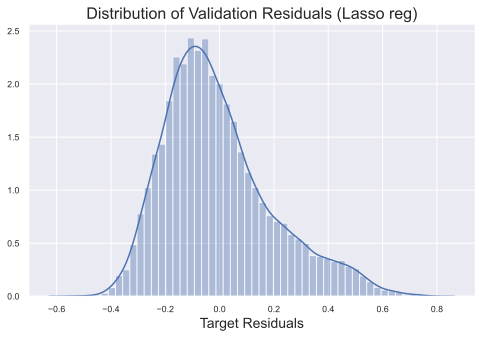

In [397]:
# Plot distribution of residuals
plt.figure(figsize=(8, 5))
sns.distplot(lasso_residual_6)
plt.xlabel('Target Residuals', size=14)
sns.despine()
plt.title('Distribution of Validation Residuals (Lasso reg)', size=16)
plt.show();

In [398]:
#fit lasso model on 80% of train data
lasso_model_6.fit(X_train_val_scaled_6, y_train_val)
list_of_feature_impt_lasso_full_6 = sorted(list(zip(X_train_val_6.columns, lasso_model_6.coef_.round(5))),key=lambda x: x[1], reverse = True)
list_of_feature_impt_lasso_full_6

Lasso(alpha=0.01)

[('floor_area_sqm', 0.18781),
 ('storey_range_encoded', 0.05911),
 ('flat_model_DBSS', 0.04491),
 ('flat_model_Type S1', 0.01615),
 ('flat_model_Maisonette', 0.00919),
 ('flat_model_Terrace', 0.00741),
 ('flat_type_2 ROOM', -0.01527),
 ('flat_type_3 ROOM', -0.01754),
 ('house_age', -0.04814)]

In [399]:
#fit lasso model on 80% of train data
lasso_model_6.fit(X_train_val_scaled_6, y_train_val)
list_of_feature_impt_lasso_full_6 = sorted(list(zip(X_train_val_6.columns, lasso_model_6.coef_.round(5))),key=lambda x: x[1], reverse = True)
list_of_feature_impt_lasso_full_6

Lasso(alpha=0.01)

[('floor_area_sqm', 0.18781),
 ('storey_range_encoded', 0.05911),
 ('flat_model_DBSS', 0.04491),
 ('flat_model_Type S1', 0.01615),
 ('flat_model_Maisonette', 0.00919),
 ('flat_model_Terrace', 0.00741),
 ('flat_type_2 ROOM', -0.01527),
 ('flat_type_3 ROOM', -0.01754),
 ('house_age', -0.04814)]

### Strongest positive predictor is 'floor_area_sqm'. With a model intercept of 12.935, for 1 unit increase in f.a.s, price is estimated to increase by SGD50k .
### 'storey_range_encoded' is the next important feature, for 1 unit increase in 'storey range_encoded' price increase by 43.9k
### flat_model_DBSS are expected to be 43.4k more expensive.
### flat_model_Type S1 are expected to be 41.8k more expensive.
### flat_model_Maisonette are expected to be 42.1k more expensive.
### flat_model_Terrace are expected to be 41.8k more expensive.
### 2 room are expected to be 40.7k cheaper.
### 3 room are expected to be 40.8k cheaper.
### for 1 unit increase in 'house_age', price decrease by 39.5k 

In [400]:
lasso_model_6.intercept_


12.935163403842962

In [401]:
for coefficient in lasso_model_6.coef_.round(5):
    np.exp(lasso_model_6.intercept_+ coefficient)

500305.1062713013

439887.109581924

433684.8528667747

417722.8293313535

421389.727864196

418467.0381168865

407429.58689745475

408355.50257641217

395151.06106209307

In [403]:
np.exp(lasso_model_6.intercept_+ 0.18781)
np.exp(lasso_model_6.intercept_+ 0.05911)
np.exp(lasso_model_6.intercept_+ 0.04491)
np.exp(lasso_model_6.intercept_+ 0.01615)
np.exp(lasso_model_6.intercept_+ 0.00919)
np.exp(lasso_model_6.intercept_+ 0.00741)
np.exp(lasso_model_6.intercept_+ -0.01527)
np.exp(lasso_model_6.intercept_+ -0.01754)
np.exp(lasso_model_6.intercept_+ -0.04814)

500305.1062713013

439887.109581924

433684.8528667747

421389.727864196

418467.0381168865

417722.8293313535

408355.50257641217

407429.58689745475

395151.06106209307

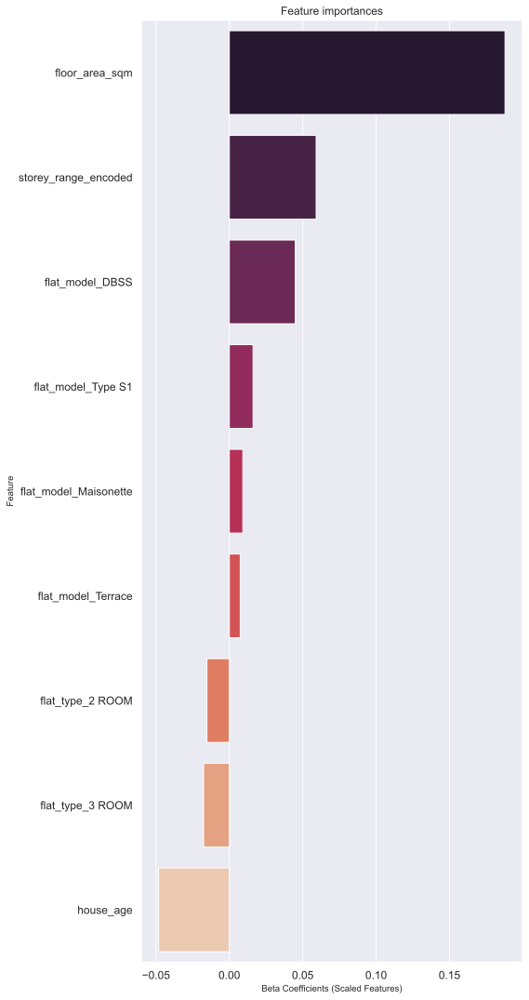

In [404]:

list_of_feature_impt_lasso_full_6_df = pd.DataFrame(list_of_feature_impt_lasso_full_6, columns =['Feature', 'Importance']) 
plt.figure(figsize=(8, 15))
sns.set_style("whitegrid")
sns.set_context("poster")
sns.set(font_scale=0.8)
list_of_feature_impt_lasso_full_6_df.sort_values('Importance',inplace=True, ascending = False)

ax = sns.barplot(x='Importance', y='Feature', data=list_of_feature_impt_lasso_full_6_df, palette="rocket")
ax.set_title("Feature importances", fontsize=12)
ax.set_xlabel("Beta Coefficients (Scaled Features)")
ax.tick_params(labelsize=12)
plt.tight_layout()
plt.show();

In [405]:
#predict on test set
lasso_test_pred_6 = lasso_model_6.predict(X_test_scaled_6).clip(12.25, 13.96) 
lasso_test_residual_6 = y_test_6 - lasso_test_pred_6

lasso_test_r_squared = lasso_model_6.score(X_test_scaled_6, y_test_6)
lasso_test_adjusted_r_squared = 1 - (1-lasso_test_r_squared)*(len(y_test_6)-1)/(len(y_val)-X_test_scaled_6.shape[1]-1)
print(f'lasso Regression Test Adjusted R^2: {lasso_test_adjusted_r_squared:.3f}')

print('Lasso model on test data RMSE: {:f}'.format(
    sqrt(mean_squared_error(y_test, lasso_test_pred_6))))
print('Lasso model on test data MAE: {:f}'.format(
    mean_absolute_error(y_test, lasso_test_pred_6)))
print('Lasso model on test data RMSE (after reversing log): {:f}'.format(
    sqrt(mean_squared_error(np.exp(y_test), np.exp(lasso_test_pred_6)))) )
print('Lasso model on test data MAE (after reversing log): {:f}'.format(
    mean_absolute_error(np.exp(y_test), np.exp(lasso_test_pred_6))))

lasso Regression Test Adjusted R^2: 0.619
Lasso model on test data RMSE: 0.202576
Lasso model on test data MAE: 0.159112
Lasso model on test data RMSE (after reversing log): 101540.893115
Lasso model on test data MAE (after reversing log): 72127.094969


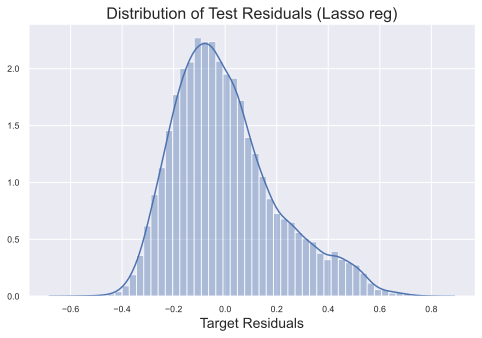

In [406]:
# Plot distribution of residuals
plt.figure(figsize=(8, 5))
sns.distplot(lasso_test_residual_6)
plt.xlabel('Target Residuals', size=14)
sns.despine()
plt.title('Distribution of Test Residuals (Lasso reg)', size=16)
plt.show();

In [407]:
ols_model_log_price_6_full = sm.OLS(y_train_val, sm.add_constant(X_train_val_6))
ols_results_log_price_6_full = ols_model_log_price_6_full.fit()
ols_results_log_price_6_full.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       resale_price_log   R-squared:                       0.628
Model:                            OLS   Adj. R-squared:                  0.628
Method:                 Least Squares   F-statistic:                 1.131e+04
Date:                Sun, 18 Oct 2020   Prob (F-statistic):               0.00
Time:                        18:05:53   Log-Likelihood:                 11302.
No. Observations:               60378   AIC:                        -2.258e+04
Df Residuals:                   60368   BIC:                        -2.249e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    12.2138      0.007   1877.370      0.000      12.201      12.227
floor_area_sqm            0.0074   5.75e-05    129.668      0.000       0.007       0.008
storey_range_encoded      0.0311      0.000     77.559      0.000       0.030       0.032
flat_model_DBSS           0.4205      0.007     63.236      0.000       0.408       0.434
flat_model_Terrace        0.7252      0.032     22.459      0.000       0.662       0.788
flat_model_Type S1        0.5812      0.019     30.271      0.000       0.544       0.619
flat_model_Maisonette     0.1259      0.005     23.309      0.000       0.115       0.136
flat_type_3 ROOM         -0.0686      0.003    -21.884      0.000      -0.075      -0.062
flat_type_2 ROOM         -0.2262      0.008    -29.973      0.000      -0.241      -0.211
house_age                -0.0042   7.44e-05    -55.892      0.000      -0.004      -0.004
==============================================================================
Omnibus:                     4856.168   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6108.165
Skew:                           0.756   Prob(JB):                         0.00
Kurtosis:                       3.378   Cond. No.                     4.08e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.08e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [408]:
X_test_6_add_c = sm.add_constant(X_test_6)
test_pred_ols_6 = ols_results_log_price_6_full.predict(X_test_6_add_c).clip(12.25, 13.96) 
print('OLS model on test data RMSE: {:f}'.format(
    sqrt(mean_squared_error(y_test, test_pred_ols_6))))
print('OLS model on test data MAE: {:f}'.format(
    mean_absolute_error(y_test, test_pred_ols_6)))
print('OLS model on test data RMSE (after reversing log): {:f}'.format(
    sqrt(mean_squared_error(np.exp(y_test), np.exp(test_pred_ols_6)))) )
print('OLS model on test data MSE (afte reversing log): {:f}'.format(
    mean_absolute_error(np.exp(y_test), np.exp(test_pred_ols_6))))

OLS model on test data RMSE: 0.201100
OLS model on test data MAE: 0.158032
OLS model on test data RMSE (after reversing log): 100295.160854
OLS model on test data MSE (afte reversing log): 71625.601945


In [409]:
sns.set_style("whitegrid")
plt.figure(figsize=(20, 6))
plt.subplot(1, 3, 1)
plt.scatter(lasso_test_pred_6, lasso_test_residual_6)
sns.despine()
plt.plot([12.4, 13.96], [0, 0], '--', color='coral')
plt.title("Residual plot (Lasso Regression)")
plt.xlabel("Test Predicted")
plt.ylabel("Test Residuals")

plt.subplot(1, 3, 2)
stats.probplot(lasso_test_residual_6, dist="norm", plot=plt)
sns.despine()
plt.title("Normal Q-Q plot")

plt.subplot(1, 3, 3)
plt.scatter(test_pred_ols_6, y_test)
sns.despine()
plt.plot([12.4, 13.96], [12.4, 13.96], '--', c='firebrick')
plt.xlabel("Predicted log price")
plt.ylabel("Actual log price")
plt.title("Actual vs. Predicted (Lasso Regression)")
plt.tight_layout()
plt.show();

In [410]:
#inspect extreme residuals
test_flats_with_large_residuals_6 = lasso_test_residual_6[(lasso_test_residual_6 >0.2) | (lasso_test_residual_6 < -0.2)].index
# flats_with_extreme_prices
df_6.iloc[test_flats_with_large_residuals_6]

,floor_area_sqm,storey_range_encoded,flat_model_DBSS,flat_model_Terrace,flat_model_Type S1,flat_model_Maisonette,flat_type_3 ROOM,flat_type_2 ROOM,house_age,resale_price_log
34525,73.00,4,0,0,0,0,1,0,25,12.45
56834,101.00,2,0,0,0,0,0,0,22,12.65
43992,104.00,2,0,0,0,0,0,0,26,12.69
61396,68.00,1,0,0,0,0,1,0,4,12.89
32075,115.00,4,0,0,0,0,0,0,18,12.91
...,...,...,...,...,...,...,...,...,...,...
17355,104.00,4,0,0,0,0,0,0,28,12.73
75130,143.00,4,0,0,0,0,0,0,36,13.50
35351,119.00,6,0,0,0,0,0,0,39,12.87
14751,94.00,1,0,0,0,0,0,0,28,13.16


In [411]:
list_of_feature_impt_test_ols_6 = sorted(list(zip(X_train_val_6.columns, ols_results_log_price_6_full.params.iloc[1:].round(2))),key=lambda x: x[1], reverse = True)
list_of_feature_impt_test_ols_6

[('flat_model_Terrace', 0.73),
 ('flat_model_Type S1', 0.58),
 ('flat_model_DBSS', 0.42),
 ('flat_model_Maisonette', 0.13),
 ('storey_range_encoded', 0.03),
 ('floor_area_sqm', 0.01),
 ('house_age', -0.0),
 ('flat_type_3 ROOM', -0.07),
 ('flat_type_2 ROOM', -0.23)]

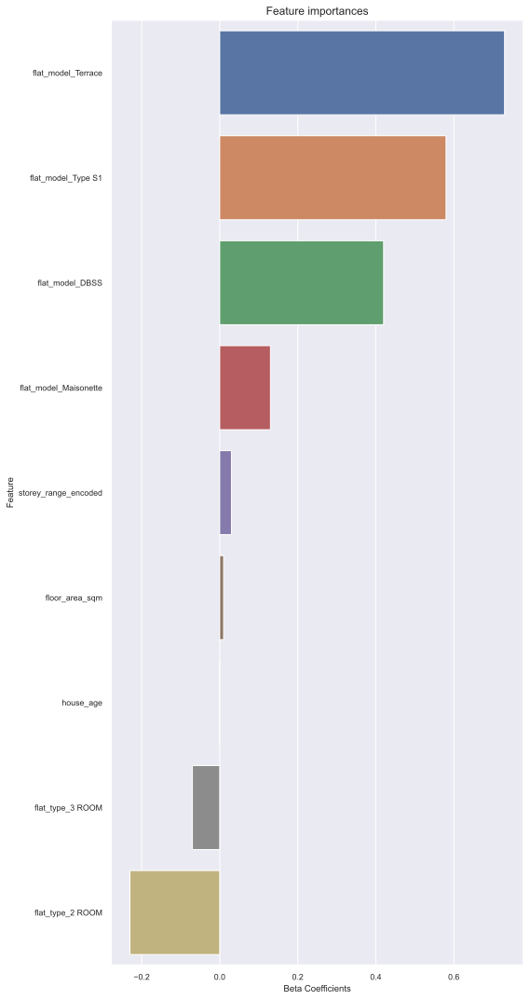

In [412]:
list_of_feature_impt_test_ols_6_df = pd.DataFrame(list_of_feature_impt_test_ols_6, columns =['Feature', 'Importance']) 
plt.figure(figsize=(8, 15))
sns.set(style = "whitegrid", color_codes=True)
sns.set(font_scale=0.8)
list_of_feature_impt_test_ols_6_df.sort_values('Importance',inplace=True, ascending = False)

ax = sns.barplot(x='Importance', y='Feature', data=list_of_feature_impt_test_ols_6_df)
ax.set_title("Feature importances", fontsize=12)
ax.set_xlabel("Beta Coefficients")
plt.tight_layout()
plt.show();

In [413]:
# extreme_residuals = selected_flats_model_df_pre_dummy.iloc[test_flats_with_large_residuals]
# extreme_residuals_set = set(extreme_residuals)
# # premium_set = set(extreme_residuals.loc[extreme_residuals['Corner Unit']==1]) + set(extreme_residuals.loc[extreme_residuals['Renovated']==1]) + set(extreme_residuals.loc[extreme_residuals['HDB_Region']=='Central'])
# # extreme_residuals_set.difference(premium_set)
# extreme_residuals_set
# extreme_residuals.head(3)

In [414]:

df_7 = df_5[['floor_area_sqm',
            'storey_range_encoded',
            'flat_model_DBSS',
            'flat_model_Terrace',
            'flat_model_Type S1',
            'flat_model_Maisonette',
            'flat_type_3 ROOM',
            'flat_type_2 ROOM',
            'house_age',
            'resale_price_log']]
X_7 = df_7.drop('resale_price_log',axis = 1).astype(float)
y = df_7['resale_price_log'].astype(float)

#Split the data 60 - 20 - 20 train/val/test

X_train_val_7, X_test_7, y_train_val, y_test = train_test_split(X_7, y, test_size=0.2,random_state=seed)
X_train_7, X_val_7, y_train, y_val = train_test_split(X_train_val_7, y_train_val, test_size=.25, random_state=seed)

ols_model_log_price_7 = sm.OLS(y_train, sm.add_constant(X_train_7))
ols_results_log_price_7 = ols_model_log_price_7.fit()

ols_results_log_price_7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       resale_price_log   R-squared:                       0.629
Model:                            OLS   Adj. R-squared:                  0.629
Method:                 Least Squares   F-statistic:                     8541.
Date:                Sun, 18 Oct 2020   Prob (F-statistic):               0.00
Time:                        18:07:12   Log-Likelihood:                 8420.3
No. Observations:               45283   AIC:                        -1.682e+04
Df Residuals:                   45273   BIC:                        -1.673e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    12.2128      0.007   1630.534      0.000      12.198      12.227
floor_area_sqm            0.0075    6.6e-05    113.423      0.000       0.007       0.008
storey_range_encoded      0.0308      0.000     66.646      0.000       0.030       0.032
flat_model_DBSS           0.4218      0.008     55.044      0.000       0.407       0.437
flat_model_Terrace        0.6871      0.037     18.616      0.000       0.615       0.759
flat_model_Type S1        0.5802      0.023     25.459      0.000       0.536       0.625
flat_model_Maisonette     0.1296      0.006     20.804      0.000       0.117       0.142
flat_type_3 ROOM         -0.0680      0.004    -18.725      0.000      -0.075      -0.061
flat_type_2 ROOM         -0.2241      0.009    -25.477      0.000      -0.241      -0.207
house_age                -0.0042    8.6e-05    -48.864      0.000      -0.004      -0.004
==============================================================================
Omnibus:                     3577.306   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4480.427
Skew:                           0.749   Prob(JB):                         0.00
Kurtosis:                       3.363   Cond. No.                     4.04e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.04e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [415]:

X_val_7_add_c = sm.add_constant(X_val_7)
val_pred_ols_7 = ols_results_log_price_7.predict(X_val_7_add_c).clip(12.25, 13.96) 

print('OLS model on test data RMSE: {:f}'.format(
    sqrt(mean_squared_error(y_val, val_pred_ols_7))))
print('OLS model on test data MAE: {:f}'.format(
    mean_absolute_error(y_val, val_pred_ols_7)))
print('OLS model on test data RMSE (after reversing log): {:f}'.format(
    sqrt(mean_squared_error(np.exp(y_val), np.exp(val_pred_ols_7)))) )
print('OLS model on test data MSE (after reversing log): {:f}'.format(
    mean_absolute_error(np.exp(y_val), np.exp(val_pred_ols_7))))

OLS model on test data RMSE: 0.199930
OLS model on test data MAE: 0.157401
OLS model on test data RMSE (after reversing log): 99622.905873
OLS model on test data MSE (after reversing log): 71246.864527


In [416]:

ols_model_log_price_7_full = sm.OLS(y_train_val, sm.add_constant(X_train_val_7))
ols_results_log_price_7_full = ols_model_log_price_7_full.fit()

ols_results_log_price_7_full.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       resale_price_log   R-squared:                       0.628
Model:                            OLS   Adj. R-squared:                  0.628
Method:                 Least Squares   F-statistic:                 1.131e+04
Date:                Sun, 18 Oct 2020   Prob (F-statistic):               0.00
Time:                        18:07:14   Log-Likelihood:                 11302.
No. Observations:               60378   AIC:                        -2.258e+04
Df Residuals:                   60368   BIC:                        -2.249e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    12.2138      0.007   1877.370      0.000      12.201      12.227
floor_area_sqm            0.0074   5.75e-05    129.668      0.000       0.007       0.008
storey_range_encoded      0.0311      0.000     77.559      0.000       0.030       0.032
flat_model_DBSS           0.4205      0.007     63.236      0.000       0.408       0.434
flat_model_Terrace        0.7252      0.032     22.459      0.000       0.662       0.788
flat_model_Type S1        0.5812      0.019     30.271      0.000       0.544       0.619
flat_model_Maisonette     0.1259      0.005     23.309      0.000       0.115       0.136
flat_type_3 ROOM         -0.0686      0.003    -21.884      0.000      -0.075      -0.062
flat_type_2 ROOM         -0.2262      0.008    -29.973      0.000      -0.241      -0.211
house_age                -0.0042   7.44e-05    -55.892      0.000      -0.004      -0.004
==============================================================================
Omnibus:                     4856.168   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6108.165
Skew:                           0.756   Prob(JB):                         0.00
Kurtosis:                       3.378   Cond. No.                     4.08e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.08e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [417]:
X_test_7_add_c = sm.add_constant(X_test_7)
test_pred_ols_7 = ols_results_log_price_7_full.predict(X_test_7_add_c).clip(12.25, 13.96) 
print('OLS model on test data RMSE: {:f}'.format(
    sqrt(mean_squared_error(y_test, test_pred_ols_7))))
print('OLS model on test data MAE: {:f}'.format(
    mean_absolute_error(y_test, test_pred_ols_7)))
print('OLS model on test data RMSE (after reversing log): {:f}'.format(
    sqrt(mean_squared_error(np.exp(y_test), np.exp(test_pred_ols_7)))) )
print('OLS model on test data MSE (after reversing log): {:f}'.format(
    mean_absolute_error(np.exp(y_test), np.exp(test_pred_ols_7))))

OLS model on test data RMSE: 0.201100
OLS model on test data MAE: 0.158032
OLS model on test data RMSE (after reversing log): 100295.160854
OLS model on test data MSE (after reversing log): 71625.601945


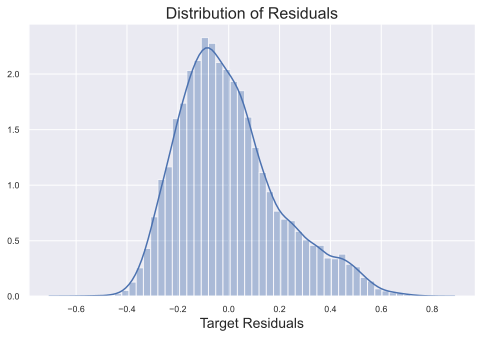

In [418]:

ols_test_residual_7 = y_test - test_pred_ols_7
# Plot distribution of residuals
plt.figure(figsize=(8, 5))
sns.distplot(ols_test_residual_7)
plt.xlabel('Target Residuals', size=14)
sns.despine()
plt.title('Distribution of Residuals', size=16)
plt.show();

In [419]:
plt.figure(figsize=(20, 6))
plt.subplot(1, 3, 1)
plt.scatter(test_pred_ols_7, ols_test_residual_7)
sns.despine()
plt.plot([12.4, 13.96], [0, 0], '--', color='coral')
plt.title("OLS Residual plot")
plt.xlabel("Test Predicted")
plt.ylabel("Test Residuals")

plt.subplot(1, 3, 2)
stats.probplot(ols_test_residual_7, dist="norm", plot=plt)
sns.despine()
plt.title("Normal Q-Q plot")

plt.subplot(1, 3, 3)
plt.scatter(test_pred_ols_7, y_test)
sns.despine()
plt.plot([12.4, 13.96], [12.4, 13.96], '--', c='firebrick')
plt.xlabel("Predicted log price")
plt.ylabel("Actual log price")
plt.title("Actual vs. Predicted (OLS)")
plt.tight_layout()
# plt.savefig('../reports/figures/selected_features_diagnostic_plot_test_set_ols.png', dpi=600)
plt.show();